### Rainfall Weather Prediction

Weather forecasting is the application of science and technology to predict the conditions of the atmosphere for a given location and time. Weather forecasts are made by collecting quantitative data about the current state of the atmosphere at a given place and using meteorology to project how the atmosphere will change.
Rain Dataset is to predict whether or not it will rain tomorrow. The Dataset contains about 10 years of daily weather observations of different locations in Australia


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

In [2]:
### Read the dataset
df = pd.read_csv("https://raw.githubusercontent.com/dsrscientist/dataset3/main/weatherAUS.csv")
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No


In [3]:
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
0,2008-12-01,Albury,13.4,22.9,0.6,NaN,NaN,W,44.0,W,...,71.0,22.0,1007.7,1007.1,8.0,NaN,16.9,21.8,No,No
1,2008-12-02,Albury,7.4,25.1,0.0,NaN,NaN,WNW,44.0,NNW,...,44.0,25.0,1010.6,1007.8,NaN,NaN,17.2,24.3,No,No
2,2008-12-03,Albury,12.9,25.7,0.0,NaN,NaN,WSW,46.0,W,...,38.0,30.0,1007.6,1008.7,NaN,2.0,21.0,23.2,No,No
3,2008-12-04,Albury,9.2,28.0,0.0,NaN,NaN,NE,24.0,SE,...,45.0,16.0,1017.6,1012.8,NaN,NaN,18.1,26.5,No,No
4,2008-12-05,Albury,17.5,32.3,1.0,NaN,NaN,W,41.0,ENE,...,82.0,33.0,1010.8,1006.0,7.0,8.0,17.8,29.7,No,No


We get first five rows using head method.

In [4]:
df.tail()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow
8420,2017-06-21,Uluru,2.8,23.4,0.0,NaN,NaN,E,31.0,SE,...,51.0,24.0,1024.6,1020.3,NaN,NaN,10.1,22.4,No,No
8421,2017-06-22,Uluru,3.6,25.3,0.0,NaN,NaN,NNW,22.0,SE,...,56.0,21.0,1023.5,1019.1,NaN,NaN,10.9,24.5,No,No
8422,2017-06-23,Uluru,5.4,26.9,0.0,NaN,NaN,N,37.0,SE,...,53.0,24.0,1021.0,1016.8,NaN,NaN,12.5,26.1,No,No
8423,2017-06-24,Uluru,7.8,27.0,0.0,NaN,NaN,SE,28.0,SSE,...,51.0,24.0,1019.4,1016.5,3.0,2.0,15.1,26.0,No,No
8424,2017-06-25,Uluru,14.9,NaN,0.0,NaN,NaN,NaN,NaN,ESE,...,62.0,36.0,1020.2,1017.9,8.0,8.0,15.0,20.9,No,NaN


We get last five rows using tail method.

In [5]:
df.shape

(8425, 23)

We see there are 8425 rows and 23 columns in this dataset.

In [6]:
df.columns

Index(['Date', 'Location', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation',
       'Sunshine', 'WindGustDir', 'WindGustSpeed', 'WindDir9am', 'WindDir3pm',
       'WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm',
       'Pressure9am', 'Pressure3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am',
       'Temp3pm', 'RainToday', 'RainTomorrow'],
      dtype='object')

This dataset contains data about the weather and rainfall details:
    
1. Date  - The date of observation
2. Location  -The common name of the location of the weather station
3. MinTemp  -The minimum temperature in degrees celsius
4. MaxTemp -The maximum temperature in degrees celsius
5. Rainfall  -The amount of rainfall recorded for the day in mm
6. Evaporation  -The so-called Class A pan evaporation (mm) in the 24 hours to 9am
7. Sunshine  -The number of hours of bright sunshine in the day.
8. WindGustDi r- The direction of the strongest wind gust in the 24 hours to midnight
9. WindGustSpeed -The speed (km/h) of the strongest wind gust in the 24 hours to midnight
10. WindDir9am -Direction of the wind at 9am
11. WindDir3pm -Direction of the wind at 3pm
12. WindSpeed9am -Wind speed (km/hr) averaged over 10 minutes prior to 9am
13. WindSpeed3pm -Wind speed (km/hr) averaged over 10 minutes prior to 3pm
14. Humidity9am -Humidity (percent) at 9am
15. Humidity3pm -Humidity (percent) at 3pm
16. Pressure9am -Atmospheric pressure (hpa) reduced to mean sea level at 9am
17. Pressure3pm -Atmospheric pressure (hpa) reduced to mean sea level at 3pm
18. Cloud9am - Fraction of sky obscured by cloud at 9am. 
19. Cloud3pm -Fraction of sky obscured by cloud 
20. Temp9am-Temperature (degrees C) at 9am
21. Temp3pm -Temperature (degrees C) at 3pm
22. RainToday -Boolean: 1 if precipitation (mm) in the 24 hours to 9am exceeds 1mm, otherwise 0
23. RainTomorrow -The amount of next day rain in mm. Used to create response variable . A kind of measure of the "risk".

There are 2 types of predictions:

a) Rainfall Tomorrow - Design a predictive model with the use of machine learning algorithms to forecast whether or not it will rain tomorrow. Since its a categorical data. We need to build classification model.

b) Rainfall - Design a predictive model with the use of machine learning algorithms to predict how much rainfall could be there. Since its a continous data, we need to build a regression model.



In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 23 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   object 
 1   Location       8425 non-null   object 
 2   MinTemp        8350 non-null   float64
 3   MaxTemp        8365 non-null   float64
 4   Rainfall       8185 non-null   float64
 5   Evaporation    4913 non-null   float64
 6   Sunshine       4431 non-null   float64
 7   WindGustDir    7434 non-null   object 
 8   WindGustSpeed  7434 non-null   float64
 9   WindDir9am     7596 non-null   object 
 10  WindDir3pm     8117 non-null   object 
 11  WindSpeed9am   8349 non-null   float64
 12  WindSpeed3pm   8318 non-null   float64
 13  Humidity9am    8366 non-null   float64
 14  Humidity3pm    8323 non-null   float64
 15  Pressure9am    7116 non-null   float64
 16  Pressure3pm    7113 non-null   float64
 17  Cloud9am       6004 non-null   float64
 18  Cloud3pm

We see there are 8425 rows and 25 columns in which 16 are of float datatype and 7  are of object datatype. These Object datatype rows needs to be encoded. We see there are so many null values in each column which need to be filled. 

In [8]:
df.isnull().sum()

Date                0
Location            0
MinTemp            75
MaxTemp            60
Rainfall          240
Evaporation      3512
Sunshine         3994
WindGustDir       991
WindGustSpeed     991
WindDir9am        829
WindDir3pm        308
WindSpeed9am       76
WindSpeed3pm      107
Humidity9am        59
Humidity3pm       102
Pressure9am      1309
Pressure3pm      1312
Cloud9am         2421
Cloud3pm         2455
Temp9am            56
Temp3pm            96
RainToday         240
RainTomorrow      239
dtype: int64

In [9]:
for i in df:
    print(df[i].value_counts())
    print("\n")

2011-01-31    5
2011-05-08    5
2011-05-21    5
2011-05-20    5
2011-05-19    5
             ..
2013-01-28    1
2013-01-29    1
2013-01-30    1
2013-01-31    1
2013-06-08    1
Name: Date, Length: 3004, dtype: int64


Melbourne       1622
Williamtown     1230
PerthAirport    1204
Albury           907
Newcastle        822
CoffsHarbour     611
Brisbane         579
Penrith          482
Wollongong       474
Darwin           250
Adelaide         205
Uluru             39
Name: Location, dtype: int64


 12.0    74
 13.2    71
 13.8    69
 12.7    68
 16.4    67
         ..
 0.3      1
 28.3     1
-1.1      1
-1.4      1
 26.0     1
Name: MinTemp, Length: 285, dtype: int64


19.0    87
23.8    75
19.8    74
25.0    71
22.0    68
        ..
11.2     1
43.1     1
42.7     1
42.9     1
43.5     1
Name: MaxTemp, Length: 331, dtype: int64


0.0      5299
0.2       406
0.4       177
0.6       116
1.2        86
         ... 
61.2        1
128.0       1
90.0        1
34.4        1
40.0        1
Name: R

We see there are no symbols or white spaces in the dataset but, there are null values, which need to be treated.

In [10]:
df["WindGustDir"].fillna(df["WindGustDir"].mode()[0], inplace = True)
df["WindDir9am"].fillna(df["WindDir9am"].mode()[0], inplace = True)
df["WindDir3pm"].fillna(df["WindDir3pm"].mode()[0], inplace = True)
df["RainToday"].fillna(df["RainToday"].mode()[0], inplace = True)
df["RainTomorrow"].fillna(df["RainTomorrow"].mode()[0], inplace = True)
df["MinTemp"].fillna(df["MinTemp"].mean(), inplace = True)
df["MaxTemp"].fillna(df["MaxTemp"].mean(), inplace = True)
df["Rainfall"].fillna(df["Rainfall"].mean(), inplace = True)
df["Evaporation"].fillna(df["Evaporation"].mean(), inplace = True)
df["Sunshine"].fillna(df["Sunshine"].mean(), inplace = True)
df["WindGustSpeed"].fillna(df["WindGustSpeed"].mean(), inplace = True)
df["WindSpeed9am"].fillna(df["WindSpeed9am"].mean(), inplace = True)
df["WindSpeed3pm"].fillna(df["WindSpeed3pm"].mean(), inplace = True)
df["Humidity9am"].fillna(df["Humidity9am"].mean(), inplace = True)
df["Humidity3pm"].fillna(df["Humidity3pm"].mean(), inplace = True)
df["Pressure9am"].fillna(df["Pressure9am"].mean(), inplace = True)
df["Pressure3pm"].fillna(df["Pressure3pm"].mean(), inplace = True)
df["Cloud9am"].fillna(df["Cloud9am"].mean(), inplace = True)
df["Cloud3pm"].fillna(df["Cloud3pm"].mean(), inplace = True)
df["Temp9am"].fillna(df["Temp9am"].mean(), inplace = True)
df["Temp3pm"].fillna(df["Temp3pm"].mean(), inplace = True)

In [11]:
df.isnull().sum()

Date             0
Location         0
MinTemp          0
MaxTemp          0
Rainfall         0
Evaporation      0
Sunshine         0
WindGustDir      0
WindGustSpeed    0
WindDir9am       0
WindDir3pm       0
WindSpeed9am     0
WindSpeed3pm     0
Humidity9am      0
Humidity3pm      0
Pressure9am      0
Pressure3pm      0
Cloud9am         0
Cloud3pm         0
Temp9am          0
Temp3pm          0
RainToday        0
RainTomorrow     0
dtype: int64

Now we have replaced all the null values using mean and mode method. So there are no nulls. Next we will check with description of the data.

In [12]:
df.describe()

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,WindSpeed9am,WindSpeed3pm,Humidity9am,Humidity3pm,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,13.847646,18.533662,67.822496,51.249790,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.442934
std,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,10.128579,9.704759,16.774231,18.311894,6.275759,6.217451,2.429205,2.299419,5.608301,5.945849
min,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,10.000000,6.000000,989.800000,982.900000,0.000000,0.000000,1.900000,7.300000
25%,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,6.000000,11.000000,56.000000,39.000000,1014.000000,1011.400000,3.000000,3.000000,13.800000,18.100000
50%,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,13.000000,19.000000,68.000000,51.000000,1017.640233,1015.236075,4.566622,4.503183,17.762015,22.000000
75%,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,20.000000,24.000000,80.000000,63.000000,1021.300000,1018.800000,7.000000,7.000000,21.900000,26.300000
max,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,63.000000,83.000000,100.000000,99.000000,1039.000000,1036.000000,8.000000,8.000000,39.400000,44.100000


We see that
1. Counts of all the columns are equal.
2. The Standard deviation is less than the mean in all columns except Rainfall which means data is almost all normal.
3. The mean and median are almost same in most of the columns but some have slight difference which means there is slight skewness.
4. There is huge difference between percentiles and max values in some of the columns. so there might be outliers

Now we see there is a date column in object type we will divide it to date, month and year format so that they converts to integer form. 

In [13]:
df[['Year','Month','Date']] = df['Date'].str.split("-",expand = True)
df[['Year','Month','Date']] = df[['Year','Month','Date']].astype(int)
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Pressure9am,Pressure3pm,Cloud9am,Cloud3pm,Temp9am,Temp3pm,RainToday,RainTomorrow,Year,Month
0,1,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,...,1007.7,1007.1,8.000000,4.503183,16.9,21.8,No,No,2008,12
1,2,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,...,1010.6,1007.8,4.566622,4.503183,17.2,24.3,No,No,2008,12
2,3,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,...,1007.6,1008.7,4.566622,2.000000,21.0,23.2,No,No,2008,12
3,4,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,...,1017.6,1012.8,4.566622,4.503183,18.1,26.5,No,No,2008,12
4,5,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,...,1010.8,1006.0,7.000000,8.000000,17.8,29.7,No,No,2008,12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,...,1024.6,1020.3,4.566622,4.503183,10.1,22.4,No,No,2017,6
8421,22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,...,1023.5,1019.1,4.566622,4.503183,10.9,24.5,No,No,2017,6
8422,23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,...,1021.0,1016.8,4.566622,4.503183,12.5,26.1,No,No,2017,6
8423,24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,...,1019.4,1016.5,3.000000,2.000000,15.1,26.0,No,No,2017,6


In [14]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8425 entries, 0 to 8424
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Date           8425 non-null   int32  
 1   Location       8425 non-null   object 
 2   MinTemp        8425 non-null   float64
 3   MaxTemp        8425 non-null   float64
 4   Rainfall       8425 non-null   float64
 5   Evaporation    8425 non-null   float64
 6   Sunshine       8425 non-null   float64
 7   WindGustDir    8425 non-null   object 
 8   WindGustSpeed  8425 non-null   float64
 9   WindDir9am     8425 non-null   object 
 10  WindDir3pm     8425 non-null   object 
 11  WindSpeed9am   8425 non-null   float64
 12  WindSpeed3pm   8425 non-null   float64
 13  Humidity9am    8425 non-null   float64
 14  Humidity3pm    8425 non-null   float64
 15  Pressure9am    8425 non-null   float64
 16  Pressure3pm    8425 non-null   float64
 17  Cloud9am       8425 non-null   float64
 18  Cloud3pm

In [15]:
df['Date'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31])

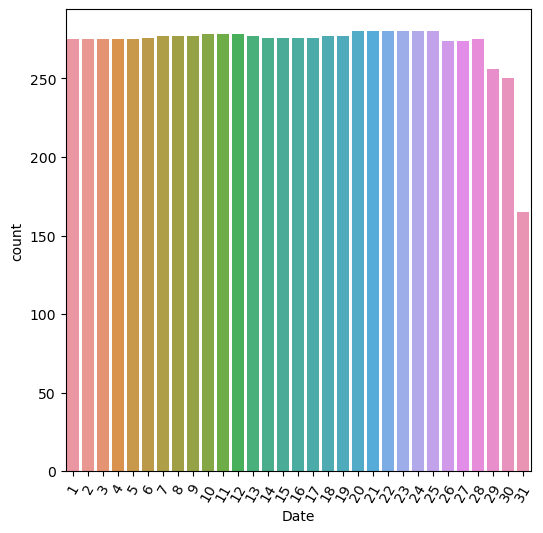

In [16]:
plt.figure(figsize = (6,6))
sns.countplot(df['Date'])
plt.xticks(rotation = 60)
plt.show()

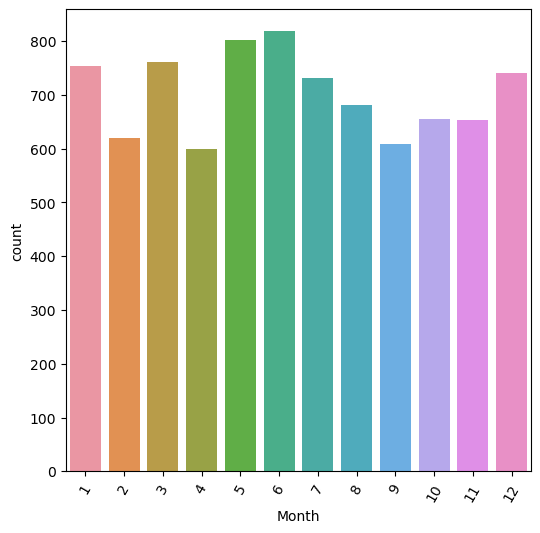

In [17]:
plt.figure(figsize = (6,6))
sns.countplot(df['Month'])
plt.xticks(rotation = 60)
plt.show()

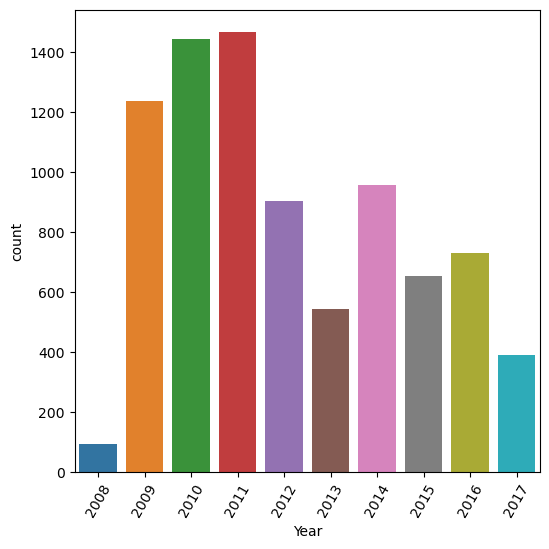

In [18]:
plt.figure(figsize = (6,6))
sns.countplot(df['Year'])
plt.xticks(rotation = 60)
plt.show()

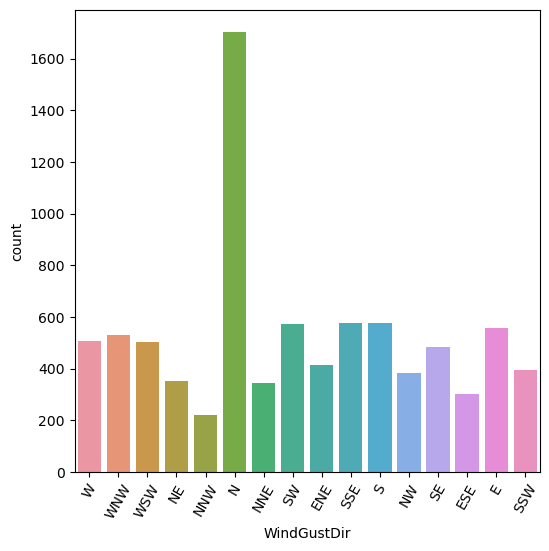

In [19]:
plt.figure(figsize = (6,6))
sns.countplot(df['WindGustDir'])
plt.xticks(rotation = 60)
plt.show()

We see that the direction of the strongest wind is from North and very least from NNW, ESE, NE and NNE 

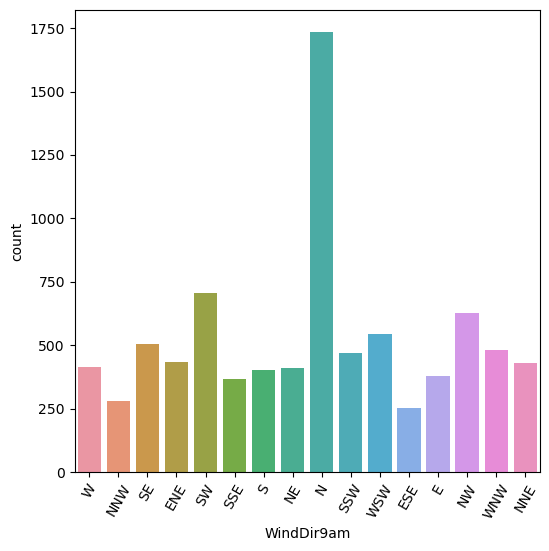

In [20]:
plt.figure(figsize = (6,6))
sns.countplot(df['WindDir9am'])
plt.xticks(rotation = 60)
plt.show()

We see that the highest wind direction at 9am was from North and least ESE and NNW and E.

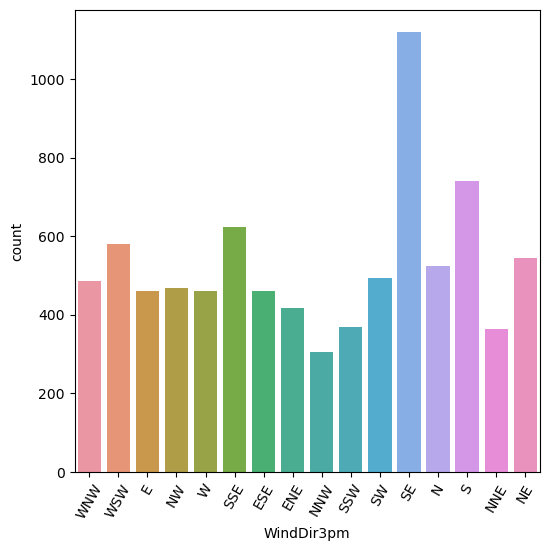

In [21]:
plt.figure(figsize = (6,6))
sns.countplot(df['WindDir3pm'])
plt.xticks(rotation = 60)
plt.show()

We see that highest wind direction at 3pm was from SE and very least from NNW.

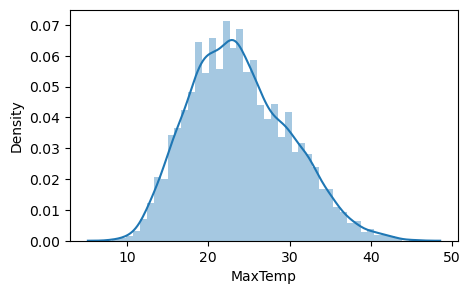

In [22]:
plt.figure(figsize = (5,3))
sns.distplot(df['MaxTemp'])
plt.show()

We see that maximum temperature is between 20-25. We see there is a normal distribution.

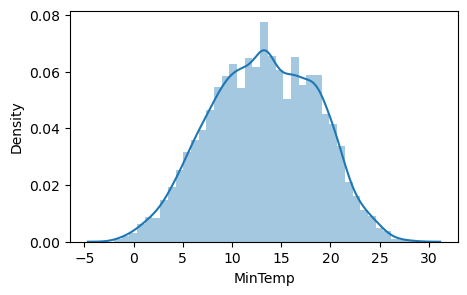

In [23]:
plt.figure(figsize = (5,3))
sns.distplot(df['MinTemp'])
plt.show()

We see that the minimum temperature lie between 10 to 15 and here also tere is normal distribution.

<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

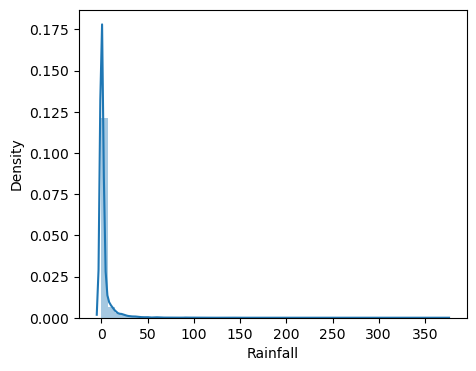

In [24]:
plt.figure(figsize = (5,4))
sns.distplot(df['Rainfall'])

We see that most of the values lie between 0 to 10. We see there is huge skewness.

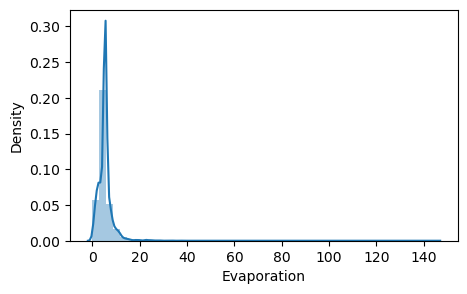

In [25]:
plt.figure(figsize = (5,3))
sns.distplot(df['Evaporation'])
plt.show()

We see that most values are nearest to 0 and here also there is askewness.

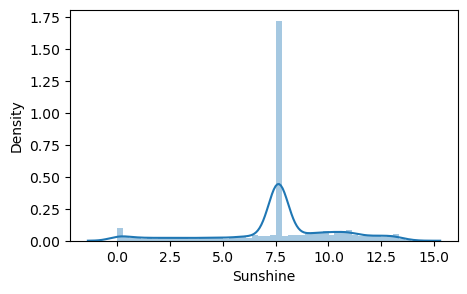

In [26]:
plt.figure(figsize = (5,3))
sns.distplot(df['Sunshine'])
plt.show()

We see that most of the values lie at 7.5 and also it looks normal distribution. but few outliers are present.

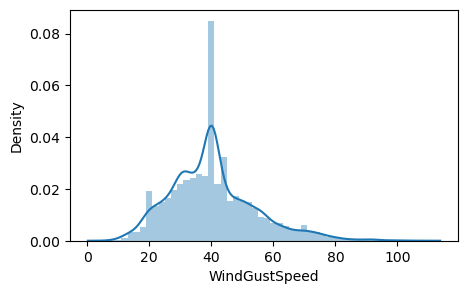

In [27]:
plt.figure(figsize = (5,3))
sns.distplot(df['WindGustSpeed'])
plt.show()

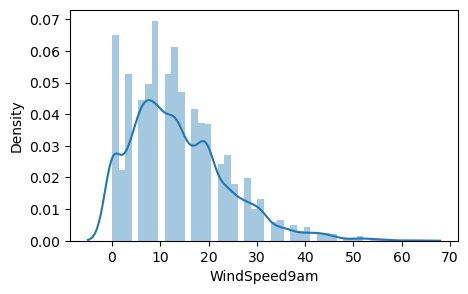

In [28]:
plt.figure(figsize = (5,3))
sns.distplot(df['WindSpeed9am'])
plt.show()

We see that highest wind speed at 9 am was within 10. and wind speed is reduced above 40.

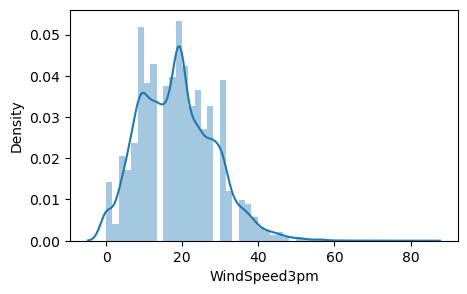

In [29]:
plt.figure(figsize = (5,3))
sns.distplot(df['WindSpeed3pm'])
plt.show()

We see that the values of wind speed at 3pm almost lies at 10 to 20.

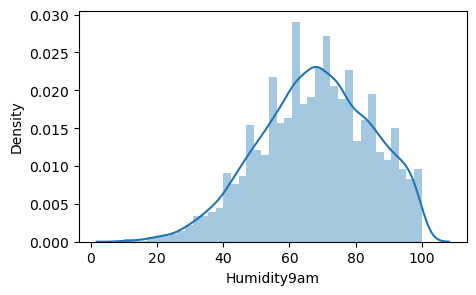

In [30]:
plt.figure(figsize = (5,3))
sns.distplot(df['Humidity9am'])
plt.show()

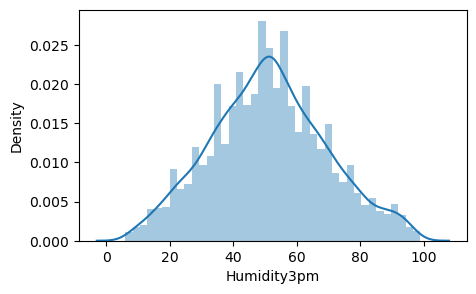

In [31]:
plt.figure(figsize = (5,3))
sns.distplot(df['Humidity3pm'])
plt.show()

We see that humidity at 9am has skewness and 3pm is almost normal distribution.

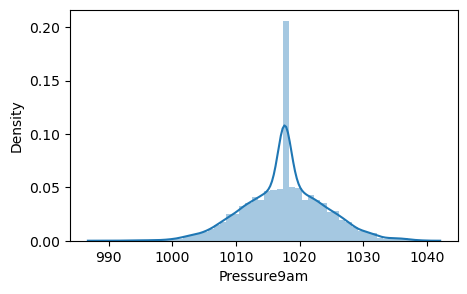

In [32]:
plt.figure(figsize = (5,3))
sns.distplot(df['Pressure9am'])
plt.show()

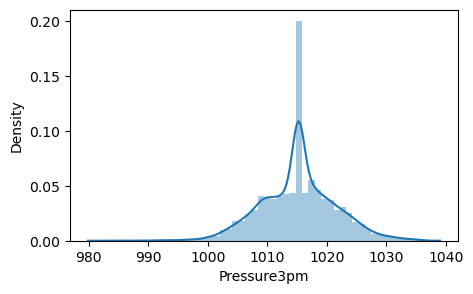

In [33]:
plt.figure(figsize = (5,3))
sns.distplot(df['Pressure3pm'])
plt.show()

We see that pressure at 9 am and 3pm is almost similar most of the values lie between 1010 to 1020.

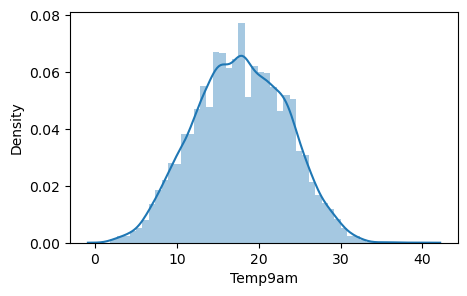

In [34]:
plt.figure(figsize = (5,3))
sns.distplot(df['Temp9am'])
plt.show()

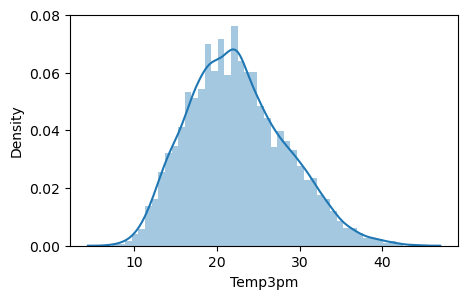

In [35]:
plt.figure(figsize = (5,3))
sns.distplot(df['Temp3pm'])
plt.show()

We see that temperature at 9am and 3pm is almost similar but there is slight skewness.

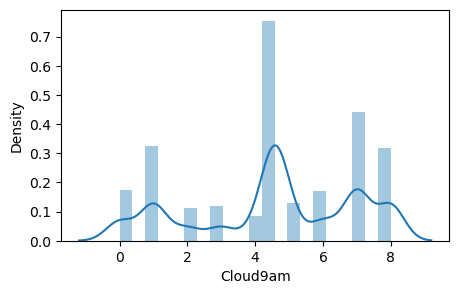

In [36]:
plt.figure(figsize = (5,3))
sns.distplot(df['Cloud9am'])
plt.show()

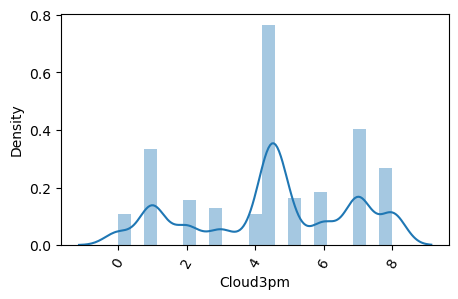

In [37]:
plt.figure(figsize = (5,3))
sns.distplot(df['Cloud3pm'])
plt.xticks(rotation = 60)
plt.show()

We see that cloud at 9am  and 3pm have similar data.

We see there are 2 values for columns like Windspeed, Humidity, pressure, temp, cloud so we will reduce these columns by calcuating the average of the similar columns. Wind Dir also has 2 columns at different timings since it has categorical data and also object values we dont reduce the data.

In [38]:
df['Avg_WindSpeed']=(df['WindSpeed9am']+df['WindSpeed3pm'])/2
df['Avg_Humidity']=(df['Humidity9am']+df['Humidity3pm'])/2
df['Avg_Cloud']=(df['Cloud9am']+df['Cloud3pm'])/2
df['Avg_Temp'] = (df['Temp9am']+df['Temp3pm'])/2
df['Avg_Pressure']=(df['Pressure9am']+df['Pressure3pm'])/2

In [39]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,...,Temp3pm,RainToday,RainTomorrow,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,Albury,13.4,22.900000,0.6,5.389395,7.632205,W,44.000000,W,...,21.8,No,No,2008,12,22.0,46.5,6.251591,19.35,1007.40
1,2,Albury,7.4,25.100000,0.0,5.389395,7.632205,WNW,44.000000,NNW,...,24.3,No,No,2008,12,13.0,34.5,4.534902,20.75,1009.20
2,3,Albury,12.9,25.700000,0.0,5.389395,7.632205,WSW,46.000000,W,...,23.2,No,No,2008,12,22.5,34.0,3.283311,22.10,1008.15
3,4,Albury,9.2,28.000000,0.0,5.389395,7.632205,NE,24.000000,SE,...,26.5,No,No,2008,12,10.0,30.5,4.534902,22.30,1015.20
4,5,Albury,17.5,32.300000,1.0,5.389395,7.632205,W,41.000000,ENE,...,29.7,No,No,2008,12,13.5,57.5,7.500000,23.75,1008.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,21,Uluru,2.8,23.400000,0.0,5.389395,7.632205,E,31.000000,SE,...,22.4,No,No,2017,6,12.0,37.5,4.534902,16.25,1022.45
8421,22,Uluru,3.6,25.300000,0.0,5.389395,7.632205,NNW,22.000000,SE,...,24.5,No,No,2017,6,11.0,38.5,4.534902,17.70,1021.30
8422,23,Uluru,5.4,26.900000,0.0,5.389395,7.632205,N,37.000000,SE,...,26.1,No,No,2017,6,9.0,38.5,4.534902,19.30,1018.90
8423,24,Uluru,7.8,27.000000,0.0,5.389395,7.632205,SE,28.000000,SSE,...,26.0,No,No,2017,6,10.0,37.5,2.500000,20.55,1017.95


In [40]:
df = df.drop(columns = ['WindSpeed9am', 'WindSpeed3pm', 'Humidity9am', 'Humidity3pm', 'Cloud9am', 'Cloud3pm', 'Temp9am', 'Temp3pm', 'Pressure9am', 'Pressure3pm'], axis=1)
df.head()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,Albury,13.4,22.9,0.6,5.389395,7.632205,W,44.0,W,WNW,No,No,2008,12,22.0,46.5,6.251591,19.35,1007.40
1,2,Albury,7.4,25.1,0.0,5.389395,7.632205,WNW,44.0,NNW,WSW,No,No,2008,12,13.0,34.5,4.534902,20.75,1009.20
2,3,Albury,12.9,25.7,0.0,5.389395,7.632205,WSW,46.0,W,WSW,No,No,2008,12,22.5,34.0,3.283311,22.10,1008.15
3,4,Albury,9.2,28.0,0.0,5.389395,7.632205,NE,24.0,SE,E,No,No,2008,12,10.0,30.5,4.534902,22.30,1015.20
4,5,Albury,17.5,32.3,1.0,5.389395,7.632205,W,41.0,ENE,NW,No,No,2008,12,13.5,57.5,7.500000,23.75,1008.40


Now we will go with Bivariate Analysis that is Comparision of Feature with target RainTomorrow

<AxesSubplot:xlabel='RainTomorrow', ylabel='Avg_WindSpeed'>

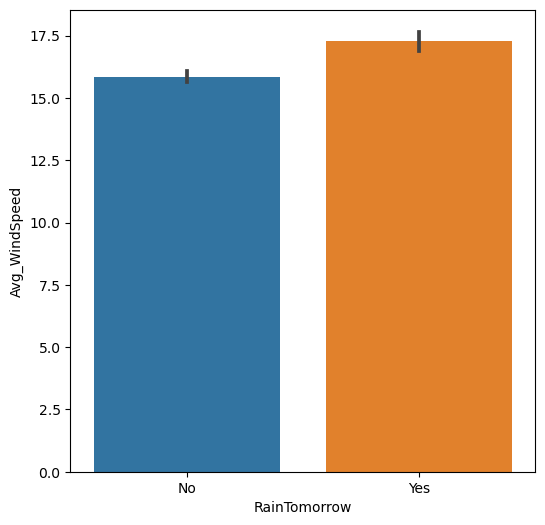

In [41]:
plt.figure(figsize = (6,6))
sns.barplot(x = "RainTomorrow", y = "Avg_WindSpeed", data = df )

<AxesSubplot:xlabel='RainTomorrow', ylabel='Avg_Humidity'>

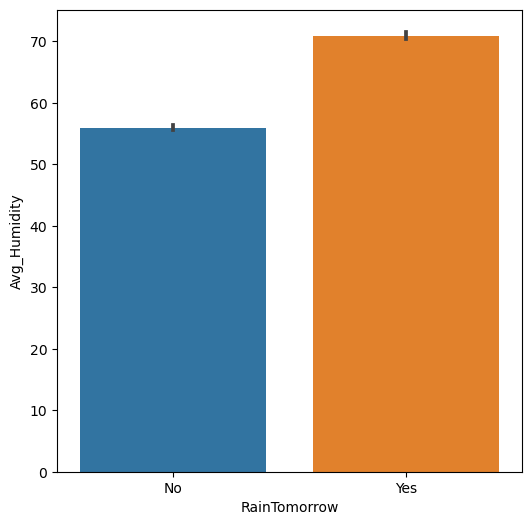

In [42]:
plt.figure(figsize = (6,6))
sns.barplot(x = "RainTomorrow", y = "Avg_Humidity", data = df )

<AxesSubplot:xlabel='RainTomorrow', ylabel='Avg_Cloud'>

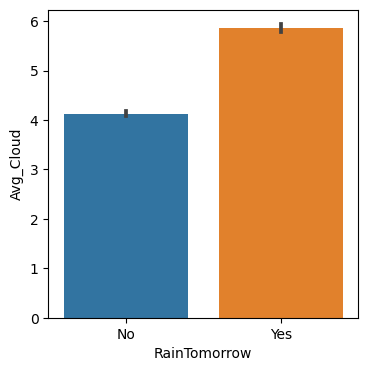

In [43]:
plt.figure(figsize = (4,4))
sns.barplot(x = "RainTomorrow", y = "Avg_Cloud", data = df )

<AxesSubplot:xlabel='RainTomorrow', ylabel='Avg_Temp'>

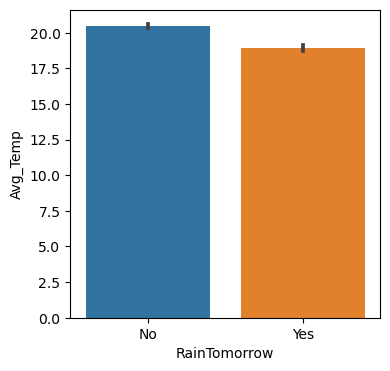

In [44]:
plt.figure(figsize = (4,4))
sns.barplot(x = "RainTomorrow", y = "Avg_Temp", data = df )

<AxesSubplot:xlabel='RainTomorrow', ylabel='Avg_Pressure'>

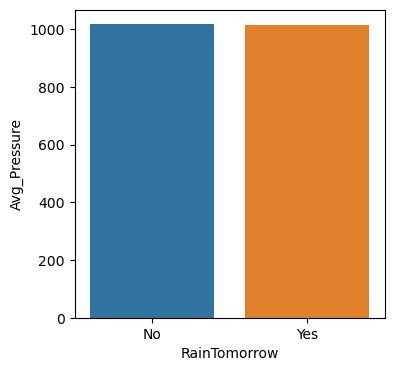

In [45]:
plt.figure(figsize = (4,4))
sns.barplot(x = "RainTomorrow", y = "Avg_Pressure", data = df )

<AxesSubplot:xlabel='RainTomorrow', ylabel='MinTemp'>

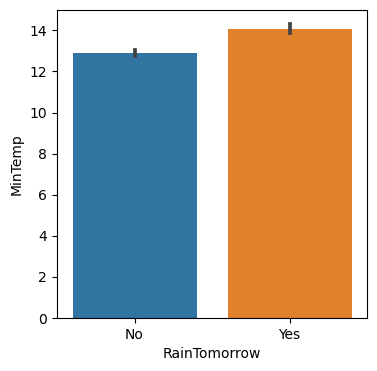

In [46]:
plt.figure(figsize = (4,4))
sns.barplot(x = "RainTomorrow", y = "MinTemp", data = df )


<AxesSubplot:xlabel='RainTomorrow', ylabel='MaxTemp'>

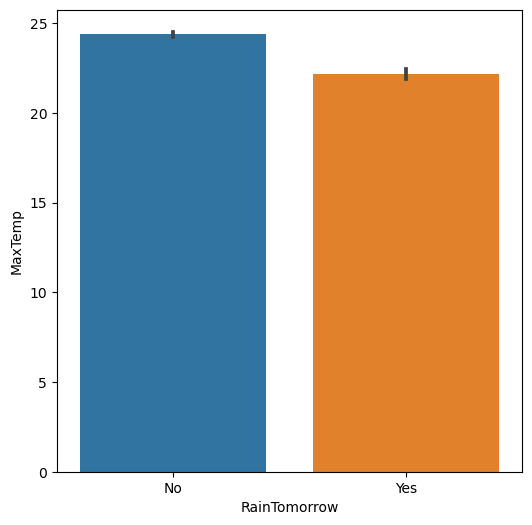

In [47]:
plt.figure(figsize = (6,6))
sns.barplot(x = "RainTomorrow", y = "MaxTemp", data = df )

<AxesSubplot:xlabel='RainTomorrow', ylabel='Rainfall'>

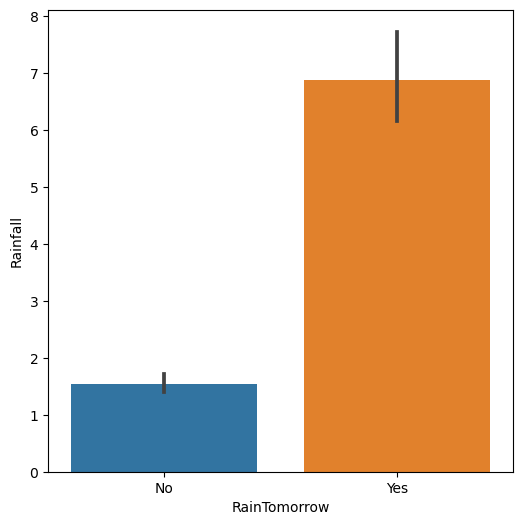

In [48]:
plt.figure(figsize = (6,6))
sns.barplot(x = "RainTomorrow", y = "Rainfall", data = df)

<AxesSubplot:xlabel='RainTomorrow', ylabel='Evaporation'>

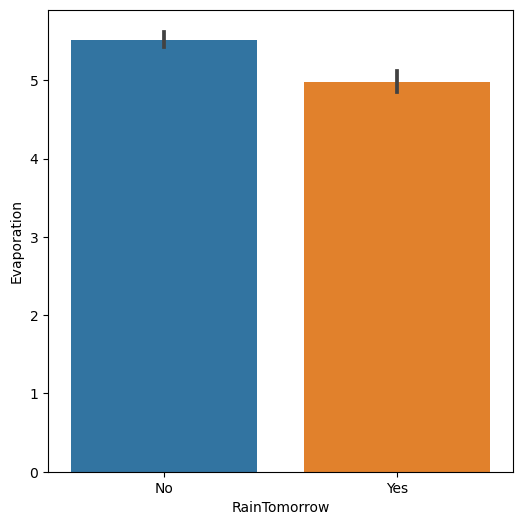

In [49]:
plt.figure(figsize = (6,6))
sns.barplot(x = "RainTomorrow", y = "Evaporation", data = df)

<AxesSubplot:xlabel='RainTomorrow', ylabel='WindGustSpeed'>

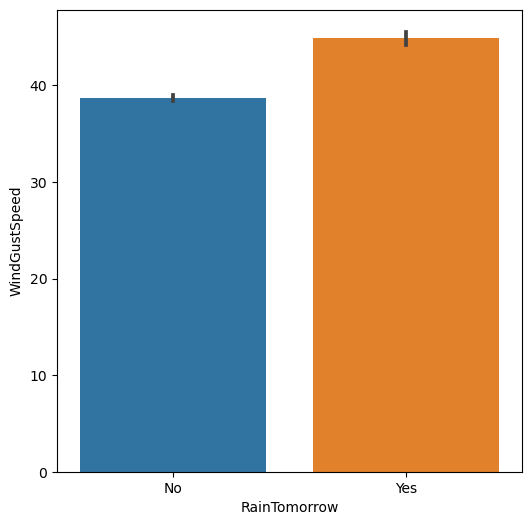

In [50]:
plt.figure(figsize = (6,6))
sns.barplot(x = "RainTomorrow", y = "WindGustSpeed", data = df )

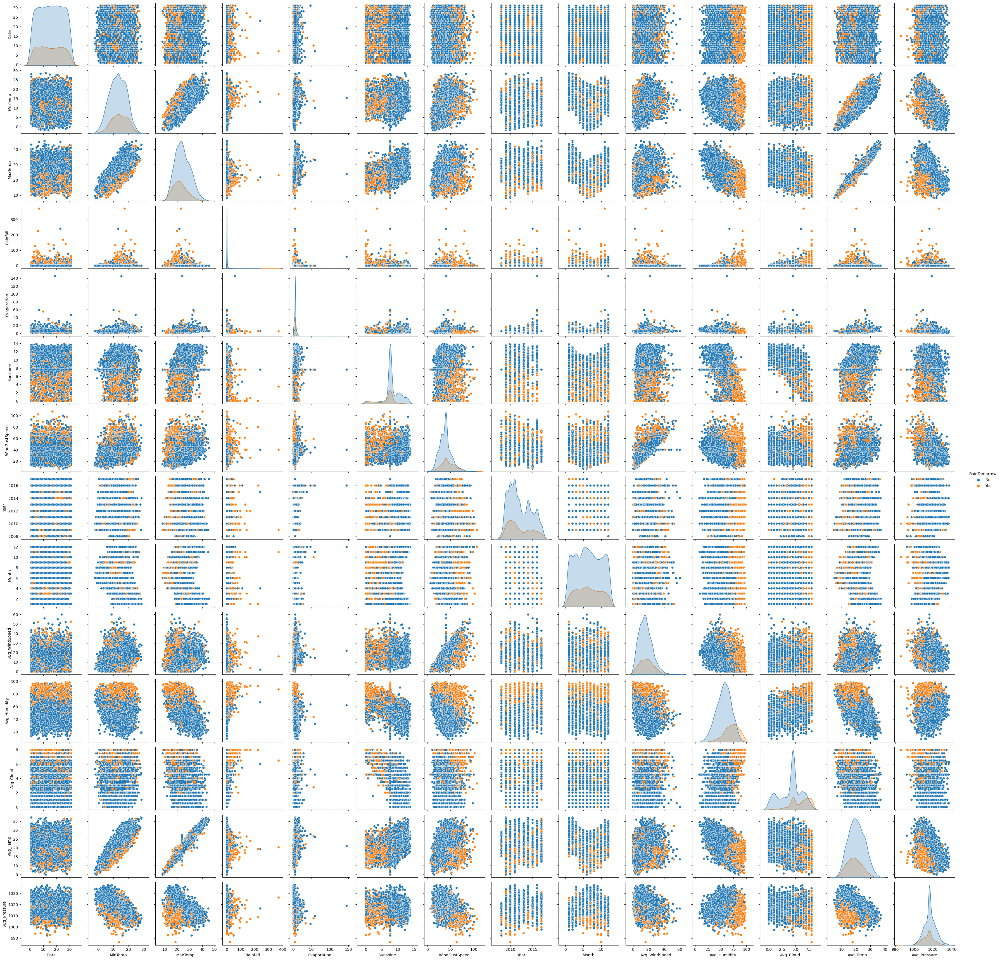

In [51]:
sns.pairplot(df, hue = 'RainTomorrow')

In [52]:
df.describe()

,Date,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustSpeed,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
count,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000,8425.000000
mean,15.741958,13.193305,23.859976,2.805913,5.389395,7.632205,40.174469,2012.102433,6.442136,16.190654,59.536143,4.534902,20.102474,1016.438154
std,8.787354,5.379488,6.114516,10.309308,3.852004,2.825451,13.776101,2.473137,3.437994,8.760580,15.856811,2.098294,5.532595,6.186076
min,1.000000,-2.000000,8.200000,0.000000,0.000000,0.000000,7.000000,2008.000000,1.000000,0.000000,8.500000,0.000000,4.900000,986.350000
25%,8.000000,9.300000,19.300000,0.000000,4.000000,7.632205,31.000000,2010.000000,3.000000,9.500000,49.000000,3.500000,16.050000,1012.700000
50%,16.000000,13.200000,23.300000,0.000000,5.389395,7.632205,40.174469,2011.000000,6.000000,15.500000,60.000000,4.534902,19.850000,1016.438154
75%,23.000000,17.300000,28.000000,1.400000,5.389395,8.900000,48.000000,2014.000000,9.000000,21.500000,70.500000,6.251591,24.000000,1020.050000
max,31.000000,28.500000,45.500000,371.000000,145.000000,13.900000,107.000000,2017.000000,12.000000,60.000000,98.500000,8.000000,37.150000,1037.300000


We see that
1. Counts of all the columns are equal.
2. The Standard deviation is less than the mean in all columns except Rainfall which means data is almost all normal.
3. The mean and median are almost same in most of the columns but some have slight difference which means there is slight skewness.
4. There is huge difference between percentiles and max values in some of the columns. so there might be outliers

In [53]:
categorical=[]
numerical = []
for i in df.dtypes.index:
    if df.dtypes[i]=='object':
        categorical.append(i)
    else:
        numerical.append(i)
print('Categorical Columns are: ', categorical)
print('Numerical Columns are: ', numerical)

Categorical Columns are:  ['Location', 'WindGustDir', 'WindDir9am', 'WindDir3pm', 'RainToday', 'RainTomorrow']
Numerical Columns are:  ['Date', 'MinTemp', 'MaxTemp', 'Rainfall', 'Evaporation', 'Sunshine', 'WindGustSpeed', 'Year', 'Month', 'Avg_WindSpeed', 'Avg_Humidity', 'Avg_Cloud', 'Avg_Temp', 'Avg_Pressure']


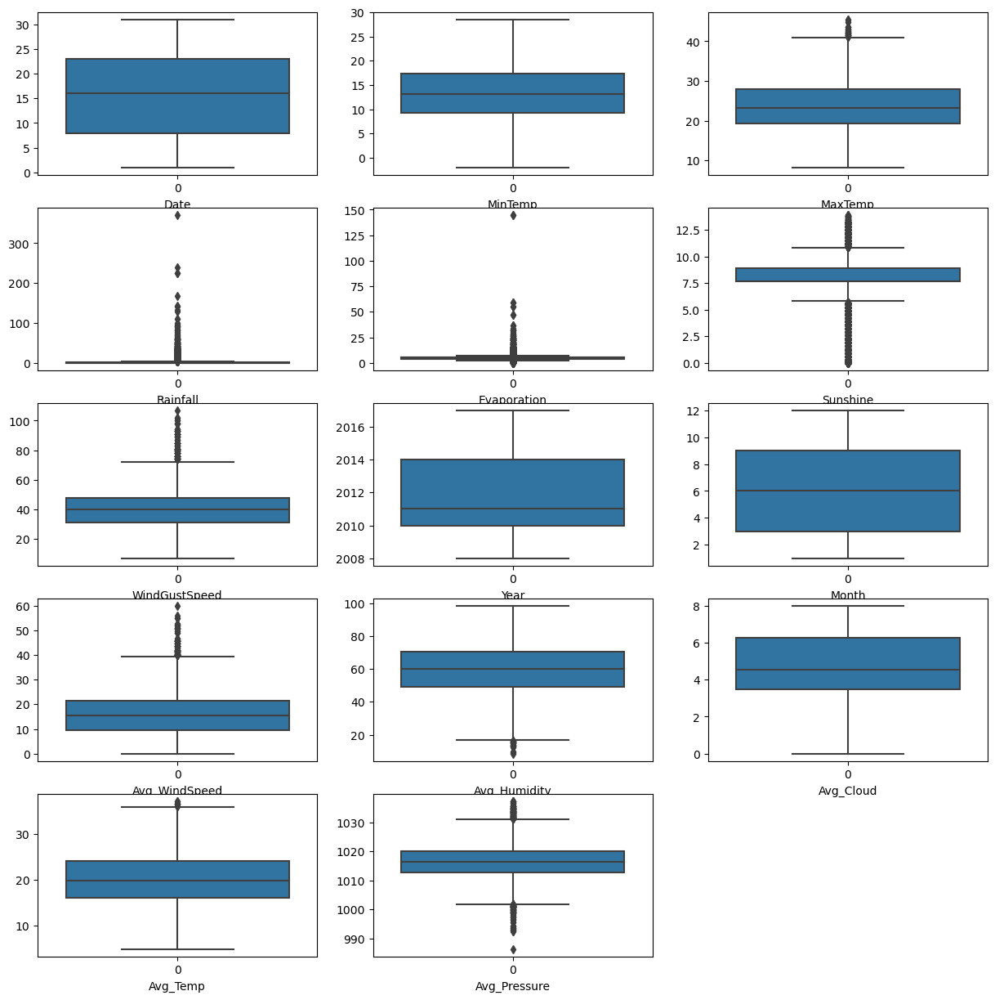

In [54]:
plt.figure(figsize =(15,15), facecolor = 'white')
num = 1
for column in numerical:
    if num <=15:
        plt.subplot(5,3,num)
        sns.boxplot(data = df[column])
        plt.xlabel(column,fontsize = 10)
        
    num +=1
plt.show()


We see there are outliers in most of the columns except Avg_cloud, year, Month, date, Min_temp. SO we willtry to remove these outliers

In [55]:
outliers = df[["MaxTemp","Rainfall","Evaporation","Sunshine","WindGustSpeed","Avg_WindSpeed","Avg_Humidity","Avg_Cloud","Avg_Temp","Avg_Pressure"]]

In [56]:
#using z_score Method
from scipy.stats import zscore
z = np.abs(zscore(outliers))
np.where(z>3) #threshold = 3
out_df=df[(z<3).all(axis=1)]
print(out_df.shape)
print("data_loss =   ", ((df.shape[0]-out_df.shape[0])/df.shape[0])*100)

(8064, 20)
data_loss =    4.28486646884273


In [57]:
#Using Iqr Method
q1 = outliers.quantile(0.25)
q3 = outliers.quantile(0.75)

iqr = q3-q1

iqr_df = df[~((df <(q1 - 1.5*iqr))| (df>(q3+1.5*iqr))).any(axis=1)]
print(iqr_df.shape)
print("data_loss =   ", ((df.shape[0]-iqr_df.shape[0])/df.shape[0])*100)

(4298, 20)
data_loss =    48.98516320474777


We see there is a huge data loss using IQR method i.e., 48.9%. By z_score method we are losing 4.28% of data. So we consider z_Score method as best method to remove outliers and we consider out_df for next steps..

In [58]:
out_df.skew()

Date             0.000534
MinTemp         -0.083008
MaxTemp          0.331997
Rainfall         3.504638
Evaporation      0.853772
Sunshine        -0.721331
WindGustSpeed    0.507816
Year             0.431326
Month            0.047265
Avg_WindSpeed    0.430396
Avg_Humidity    -0.158005
Avg_Cloud       -0.370482
Avg_Temp         0.142750
Avg_Pressure     0.061896
dtype: float64

We see that all the values are in range except Rainfall, Evaporation, Sunshine which are not in range i.e., between +/- 0.5. SO we will reduce the skewness. 

In [59]:
from scipy.stats import yeojohnson, boxcox
out_df['Rainfall'] = yeojohnson(out_df['Rainfall'])[0]
out_df.skew()

Date             0.000534
MinTemp         -0.083008
MaxTemp          0.331997
Rainfall         0.918392
Evaporation      0.853772
Sunshine        -0.721331
WindGustSpeed    0.507816
Year             0.431326
Month            0.047265
Avg_WindSpeed    0.430396
Avg_Humidity    -0.158005
Avg_Cloud       -0.370482
Avg_Temp         0.142750
Avg_Pressure     0.061896
dtype: float64

In [60]:
out_df['Rainfall'] = yeojohnson(out_df['Rainfall'])[0]
out_df['Evaporation'] = yeojohnson(out_df['Evaporation'])[0]
out_df['Sunshine'] = yeojohnson(out_df['Sunshine'])[0]
out_df.skew()

Date             0.000534
MinTemp         -0.083008
MaxTemp          0.331997
Rainfall         0.677490
Evaporation      0.073947
Sunshine        -0.064872
WindGustSpeed    0.507816
Year             0.431326
Month            0.047265
Avg_WindSpeed    0.430396
Avg_Humidity    -0.158005
Avg_Cloud       -0.370482
Avg_Temp         0.142750
Avg_Pressure     0.061896
dtype: float64

In [61]:
#out_df['Rainfall'] = yeojohnson(out_df['Rainfall'])[0]
#out_df.skew()

Now, we have reduced still more skewness in all columns except Rainfall which is slight highes than the expected value.

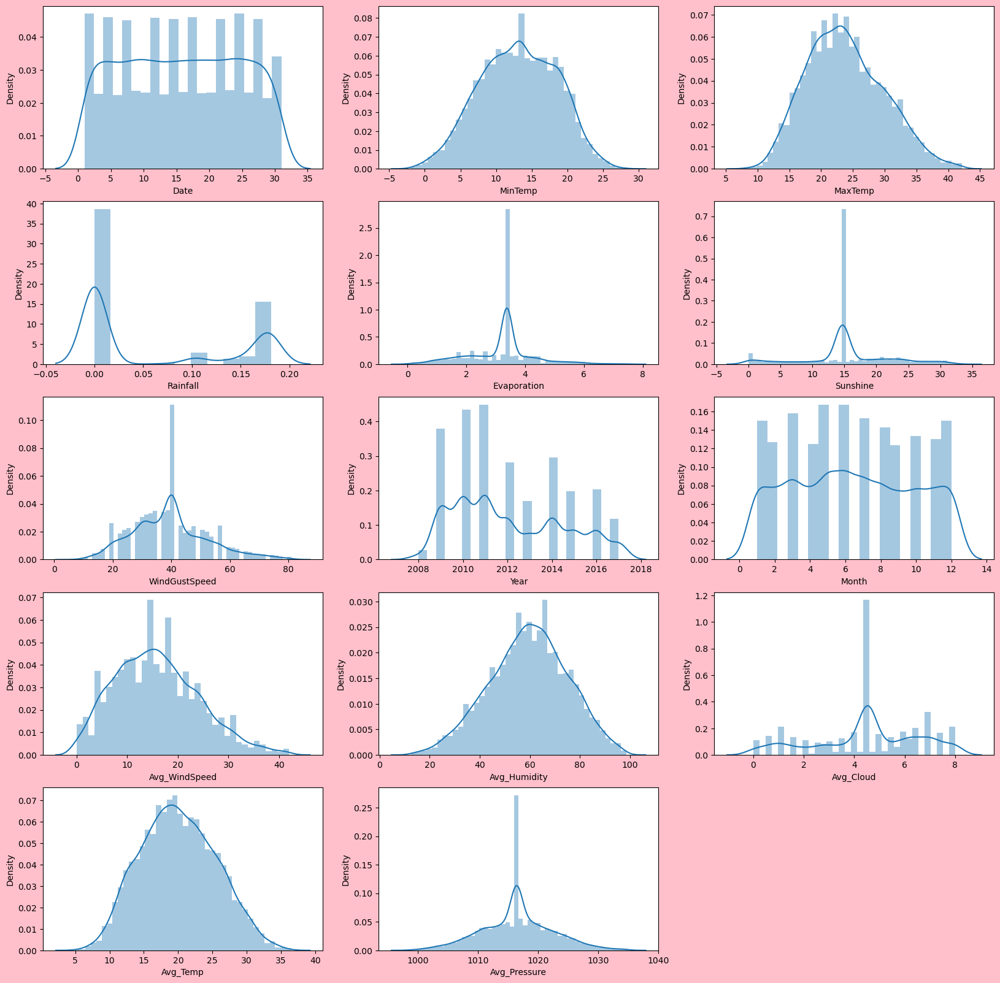

In [62]:
plt.figure(figsize =(20,20), facecolor = 'pink')
num = 1
for column in numerical:
    if num <=15:
        plt.subplot(5,3,num)
        sns.distplot(out_df[column])
        plt.xlabel(column,fontsize = 10)
        
    num +=1
plt.show()

In [63]:
out_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,Albury,13.4,22.900000,0.151560,3.378077,14.718234,W,44.000000,W,WNW,No,No,2008,12,22.0,46.5,6.251591,19.35,1007.40
1,2,Albury,7.4,25.100000,-0.000000,3.378077,14.718234,WNW,44.000000,NNW,WSW,No,No,2008,12,13.0,34.5,4.534902,20.75,1009.20
2,3,Albury,12.9,25.700000,-0.000000,3.378077,14.718234,WSW,46.000000,W,WSW,No,No,2008,12,22.5,34.0,3.283311,22.10,1008.15
3,4,Albury,9.2,28.000000,-0.000000,3.378077,14.718234,NE,24.000000,SE,E,No,No,2008,12,10.0,30.5,4.534902,22.30,1015.20
4,5,Albury,17.5,32.300000,0.164625,3.378077,14.718234,W,41.000000,ENE,NW,No,No,2008,12,13.5,57.5,7.500000,23.75,1008.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,21,Uluru,2.8,23.400000,-0.000000,3.378077,14.718234,E,31.000000,SE,ENE,No,No,2017,6,12.0,37.5,4.534902,16.25,1022.45
8421,22,Uluru,3.6,25.300000,-0.000000,3.378077,14.718234,NNW,22.000000,SE,N,No,No,2017,6,11.0,38.5,4.534902,17.70,1021.30
8422,23,Uluru,5.4,26.900000,-0.000000,3.378077,14.718234,N,37.000000,SE,WNW,No,No,2017,6,9.0,38.5,4.534902,19.30,1018.90
8423,24,Uluru,7.8,27.000000,-0.000000,3.378077,14.718234,SE,28.000000,SSE,N,No,No,2017,6,10.0,37.5,2.500000,20.55,1017.95


#### Label Encoding

In [64]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
for i in out_df.columns:
    if out_df[i].dtypes == 'object':
        out_df[i] = le.fit_transform(out_df[i])
out_df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,1,13.4,22.900000,0.151560,3.378077,14.718234,13,44.000000,13,14,0,0,2008,12,22.0,46.5,6.251591,19.35,1007.40
1,2,1,7.4,25.100000,-0.000000,3.378077,14.718234,14,44.000000,6,15,0,0,2008,12,13.0,34.5,4.534902,20.75,1009.20
2,3,1,12.9,25.700000,-0.000000,3.378077,14.718234,15,46.000000,13,15,0,0,2008,12,22.5,34.0,3.283311,22.10,1008.15
3,4,1,9.2,28.000000,-0.000000,3.378077,14.718234,4,24.000000,9,0,0,0,2008,12,10.0,30.5,4.534902,22.30,1015.20
4,5,1,17.5,32.300000,0.164625,3.378077,14.718234,13,41.000000,1,7,0,0,2008,12,13.5,57.5,7.500000,23.75,1008.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,21,9,2.8,23.400000,-0.000000,3.378077,14.718234,0,31.000000,9,1,0,0,2017,6,12.0,37.5,4.534902,16.25,1022.45
8421,22,9,3.6,25.300000,-0.000000,3.378077,14.718234,6,22.000000,9,3,0,0,2017,6,11.0,38.5,4.534902,17.70,1021.30
8422,23,9,5.4,26.900000,-0.000000,3.378077,14.718234,3,37.000000,9,14,0,0,2017,6,9.0,38.5,4.534902,19.30,1018.90
8423,24,9,7.8,27.000000,-0.000000,3.378077,14.718234,9,28.000000,10,3,0,0,2017,6,10.0,37.5,2.500000,20.55,1017.95


In [65]:
df = out_df

In [66]:
df

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,1,1,13.4,22.900000,0.151560,3.378077,14.718234,13,44.000000,13,14,0,0,2008,12,22.0,46.5,6.251591,19.35,1007.40
1,2,1,7.4,25.100000,-0.000000,3.378077,14.718234,14,44.000000,6,15,0,0,2008,12,13.0,34.5,4.534902,20.75,1009.20
2,3,1,12.9,25.700000,-0.000000,3.378077,14.718234,15,46.000000,13,15,0,0,2008,12,22.5,34.0,3.283311,22.10,1008.15
3,4,1,9.2,28.000000,-0.000000,3.378077,14.718234,4,24.000000,9,0,0,0,2008,12,10.0,30.5,4.534902,22.30,1015.20
4,5,1,17.5,32.300000,0.164625,3.378077,14.718234,13,41.000000,1,7,0,0,2008,12,13.5,57.5,7.500000,23.75,1008.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,21,9,2.8,23.400000,-0.000000,3.378077,14.718234,0,31.000000,9,1,0,0,2017,6,12.0,37.5,4.534902,16.25,1022.45
8421,22,9,3.6,25.300000,-0.000000,3.378077,14.718234,6,22.000000,9,3,0,0,2017,6,11.0,38.5,4.534902,17.70,1021.30
8422,23,9,5.4,26.900000,-0.000000,3.378077,14.718234,3,37.000000,9,14,0,0,2017,6,9.0,38.5,4.534902,19.30,1018.90
8423,24,9,7.8,27.000000,-0.000000,3.378077,14.718234,9,28.000000,10,3,0,0,2017,6,10.0,37.5,2.500000,20.55,1017.95


In [67]:
df.corr()

,Date,Location,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Year,Month,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
Date,1.000000,-0.004871,0.010713,0.017439,-0.025122,0.013132,0.005761,0.015766,0.000268,-0.012819,-0.000074,-0.016886,-0.008827,-0.006366,0.001448,-0.005557,0.012116,-0.001090,0.014308,-0.015889
Location,-0.004871,1.000000,0.116424,0.063390,0.024258,0.132323,0.039663,-0.036941,0.241315,-0.041814,-0.030331,0.003070,0.010479,0.478224,-0.085526,0.262379,0.039976,0.039391,0.091969,-0.017092
MinTemp,0.010713,0.116424,1.000000,0.719165,0.062010,0.374188,0.088117,-0.152682,0.233256,-0.047341,-0.150456,0.058871,0.089358,0.039785,-0.244675,0.189135,-0.023110,0.069941,0.820281,-0.435959
MaxTemp,0.017439,0.063390,0.719165,1.000000,-0.251481,0.474513,0.401575,-0.234396,0.142090,-0.218707,-0.184005,-0.222665,-0.151910,0.119375,-0.161439,0.064812,-0.447703,-0.282606,0.962185,-0.378570
Rainfall,-0.025122,0.024258,0.062010,-0.251481,1.000000,-0.208093,-0.276630,0.143750,0.074580,0.157149,0.121844,0.805501,0.305039,0.024573,0.024680,0.034348,0.439119,0.324522,-0.201473,-0.077340
Evaporation,0.013132,0.132323,0.374188,0.474513,-0.208093,1.000000,0.387211,-0.121891,0.189715,-0.111767,-0.035566,-0.169111,-0.089655,0.135744,-0.050578,0.123409,-0.303459,-0.143132,0.472182,-0.272907
Sunshine,0.005761,0.039663,0.088117,0.401575,-0.276630,0.387211,1.000000,-0.110101,0.025042,-0.082199,-0.072640,-0.222056,-0.314241,0.023547,0.000234,0.049797,-0.458486,-0.618706,0.367480,-0.039542
WindGustDir,0.015766,-0.036941,-0.152682,-0.234396,0.143750,-0.121891,-0.110101,1.000000,0.002328,0.405457,0.505133,0.122074,0.046754,-0.095329,0.033217,0.078928,0.048667,0.122246,-0.224504,-0.052140
WindGustSpeed,0.000268,0.241315,0.233256,0.142090,0.074580,0.189715,0.025042,0.002328,1.000000,-0.076856,0.074688,0.073627,0.180322,-0.041864,0.049076,0.687225,-0.196155,0.041956,0.161256,-0.359212
WindDir9am,-0.012819,-0.041814,-0.047341,-0.218707,0.157149,-0.111767,-0.082199,0.405457,-0.076856,1.000000,0.241862,0.149221,0.030414,-0.033197,0.016235,0.069134,0.079458,0.088737,-0.173706,0.041909


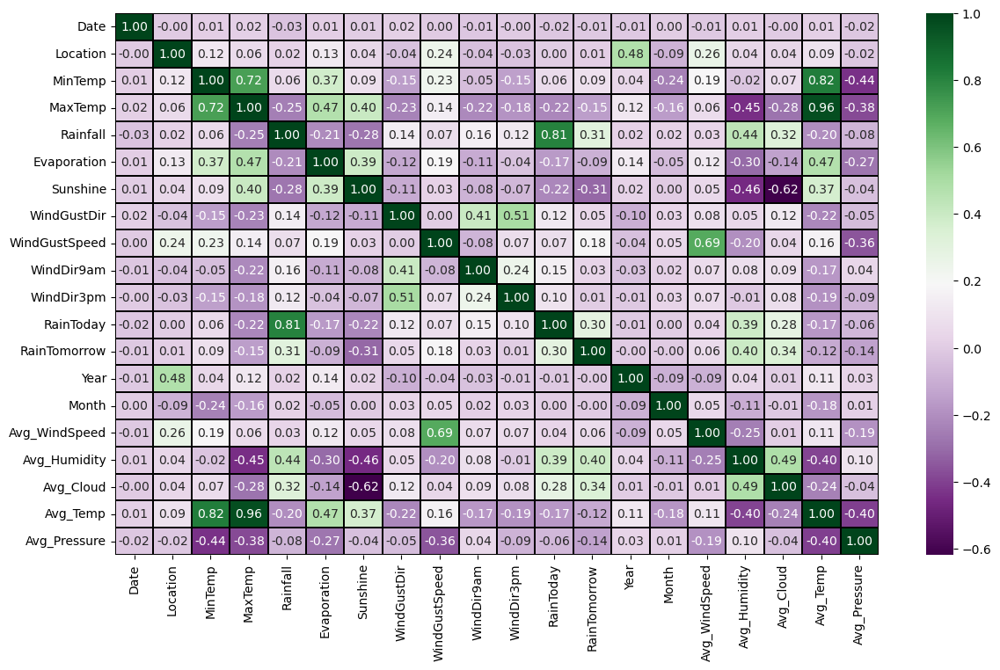

In [69]:
plt.figure(figsize = (14,8))
sns.heatmap(df.corr(), linewidths = 0.1, fmt = '0.2f', linecolor = "Black", annot=True, cmap = 'PRGn')
plt.show()

We see that 
1. Max_temp , Min_temp and Avg_temp are having highest correlation with eachother.
2. Rainfall(target) and Rain_today are havinng correlation
3. Rain Tomorrow(target) is not having any higher correlation with features. Avg_humiddity, Avg_cloud, Rainfall, RainToday is having slight correlation with RainTomorrow.
4. Max_temp is correlated with min_temp.
5. WindGustSpeed is correlate with Avg_WindSpeed
6. Sunshine with Avg_cloud is having highest negative correlation.

In [70]:
df.corr().sum()

Date             0.993451
Location         2.326286
MinTemp          2.817021
MaxTemp          1.431062
Rainfall         2.501234
Evaporation      1.796257
Sunshine         0.193827
WindGustDir      1.496335
WindGustSpeed    2.502657
WindDir9am       1.481171
WindDir3pm       1.451700
RainToday        2.439116
RainTomorrow     1.938162
Year             1.629812
Month            0.290868
Avg_WindSpeed    2.358374
Avg_Humidity     0.842049
Avg_Cloud        1.549820
Avg_Temp         1.816754
Avg_Pressure    -1.392286
dtype: float64

In [72]:
df.corr()['RainTomorrow'].sort_values()


Sunshine        -0.314241
MaxTemp         -0.151910
Avg_Pressure    -0.141195
Avg_Temp        -0.115337
Evaporation     -0.089655
Date            -0.008827
Year            -0.001438
Month           -0.000677
WindDir3pm       0.005214
Location         0.010479
WindDir9am       0.030414
WindGustDir      0.046754
Avg_WindSpeed    0.059411
MinTemp          0.089358
WindGustSpeed    0.180322
RainToday        0.295705
Rainfall         0.305039
Avg_Cloud        0.342018
Avg_Humidity     0.396729
RainTomorrow     1.000000
Name: RainTomorrow, dtype: float64

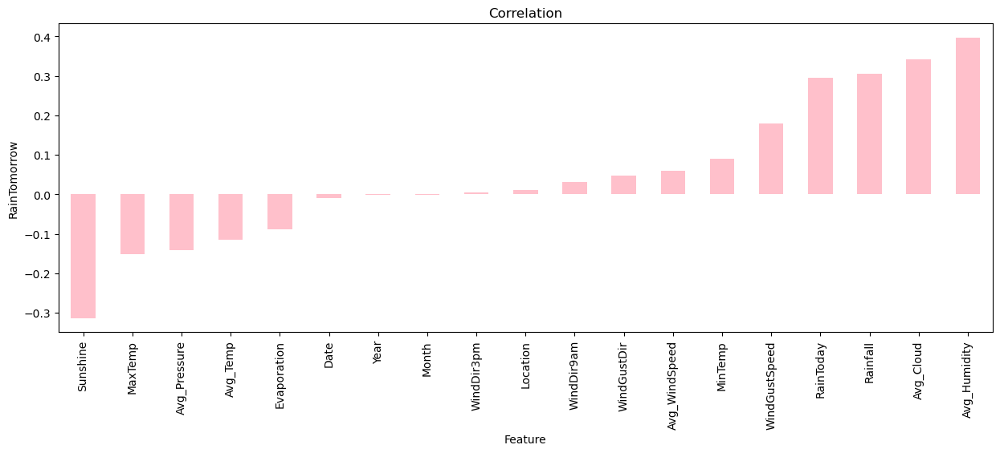

In [71]:
plt.figure(figsize=(15,5))
df.corr()['RainTomorrow'].sort_values(ascending=True).drop(['RainTomorrow']).plot(kind='bar',color='pink')
plt.title('Correlation')
plt.xlabel('Feature')
plt.ylabel('RainTomorrow')
plt.show()

We see that date , year, month are not having any correlation with Target. Avg_humidity is having the highest positive correlation whereas Sunshine has the highest negative correlation.

In [73]:
df.corr()['Rainfall'].sort_values()

Sunshine        -0.276630
MaxTemp         -0.251481
Evaporation     -0.208093
Avg_Temp        -0.201473
Avg_Pressure    -0.077340
Date            -0.025122
Location         0.024258
Year             0.024573
Month            0.024680
Avg_WindSpeed    0.034348
MinTemp          0.062010
WindGustSpeed    0.074580
WindDir3pm       0.121844
WindGustDir      0.143750
WindDir9am       0.157149
RainTomorrow     0.305039
Avg_Cloud        0.324522
Avg_Humidity     0.439119
RainToday        0.805501
Rainfall         1.000000
Name: Rainfall, dtype: float64

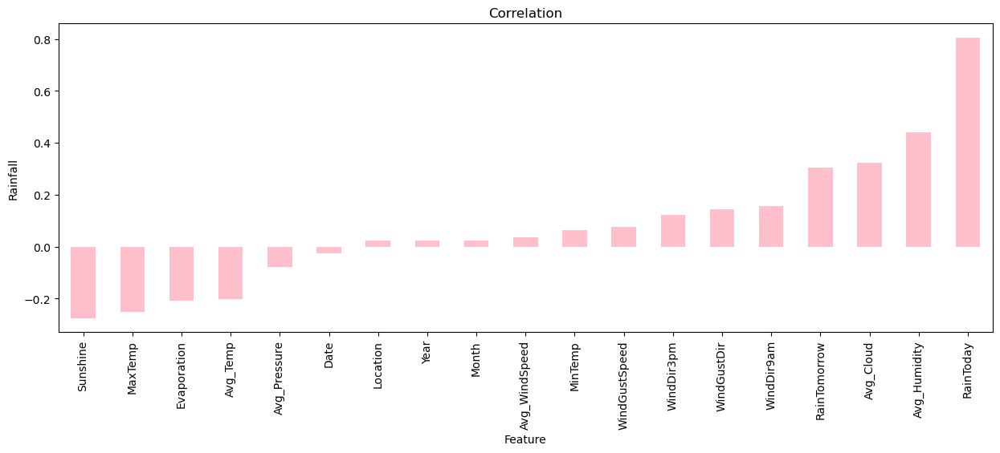

In [74]:
plt.figure(figsize=(15,5))
df.corr()['Rainfall'].sort_values(ascending=True).drop(['Rainfall']).plot(kind='bar',color='pink')
plt.title('Correlation')
plt.xlabel('Feature')
plt.ylabel('Rainfall')
plt.show()

We see that RainToday is having highest positive correlation, Sunshine is having highest negative correlation.
In both corr of targets we see that date, month year locations are not having much correlation.

In [76]:
### So its better to drop these features.
df.drop(columns = ['Date','Month','Year','Location'], axis = 1, inplace= True)

In [77]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,13.4,22.900000,0.151560,3.378077,14.718234,13,44.000000,13,14,0,0,22.0,46.5,6.251591,19.35,1007.40
1,7.4,25.100000,-0.000000,3.378077,14.718234,14,44.000000,6,15,0,0,13.0,34.5,4.534902,20.75,1009.20
2,12.9,25.700000,-0.000000,3.378077,14.718234,15,46.000000,13,15,0,0,22.5,34.0,3.283311,22.10,1008.15
3,9.2,28.000000,-0.000000,3.378077,14.718234,4,24.000000,9,0,0,0,10.0,30.5,4.534902,22.30,1015.20
4,17.5,32.300000,0.164625,3.378077,14.718234,13,41.000000,1,7,0,0,13.5,57.5,7.500000,23.75,1008.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,-0.000000,3.378077,14.718234,0,31.000000,9,1,0,0,12.0,37.5,4.534902,16.25,1022.45
8421,3.6,25.300000,-0.000000,3.378077,14.718234,6,22.000000,9,3,0,0,11.0,38.5,4.534902,17.70,1021.30
8422,5.4,26.900000,-0.000000,3.378077,14.718234,3,37.000000,9,14,0,0,9.0,38.5,4.534902,19.30,1018.90
8423,7.8,27.000000,-0.000000,3.378077,14.718234,9,28.000000,10,3,0,0,10.0,37.5,2.500000,20.55,1017.95


### Rain Tomorrow Prediction.
#### divide the data into features and labels

In [78]:
x = df.drop(columns = ['RainTomorrow'], axis = 1)
y = df['RainTomorrow']

In [79]:
x.shape

(8064, 15)

In [80]:
y.shape

(8064,)

In [81]:
from sklearn.preprocessing import StandardScaler
sr = StandardScaler()
x = pd.DataFrame(sr.fit_transform(x), columns = x.columns)
x

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,0.053772,-0.150131,1.156399,0.181193,-0.09805,1.233582,0.352079,1.256877,1.400197,-0.541229,0.744235,-0.830152,0.833218,-0.127483,-1.542502
1,-1.060593,0.214020,-0.738669,0.181193,-0.09805,1.446370,0.352079,-0.273201,1.626646,-0.541229,-0.339245,-1.596501,0.012891,0.127305,-1.240065
2,-0.039092,0.313334,-0.738669,0.181193,-0.09805,1.659158,0.507491,1.256877,1.626646,-0.541229,0.804429,-1.628432,-0.585187,0.372992,-1.416487
3,-0.726283,0.694038,-0.738669,0.181193,-0.09805,-0.681506,-1.202039,0.382547,-1.770086,-0.541229,-0.700405,-1.851951,0.012891,0.409390,-0.231940
4,0.815254,1.405788,1.319756,0.181193,-0.09805,1.233582,0.118962,-1.366114,-0.184944,-0.541229,-0.279052,-0.127665,1.429775,0.673277,-1.374482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059,-1.914939,-0.067369,-0.738669,0.181193,-0.09805,-1.532657,-0.658098,0.382547,-1.543638,-0.541229,-0.459632,-1.404914,0.012891,-0.691655,0.986211
8060,-1.766357,0.247125,-0.738669,0.181193,-0.09805,-0.255931,-1.357451,0.382547,-1.090740,-0.541229,-0.580018,-1.341051,0.012891,-0.427768,0.792987
8061,-1.432047,0.511962,-0.738669,0.181193,-0.09805,-0.894294,-0.191862,0.382547,1.400197,-0.541229,-0.820792,-1.341051,0.012891,-0.136582,0.389737
8062,-0.986302,0.528515,-0.738669,0.181193,-0.09805,0.382432,-0.891215,0.601129,-1.090740,-0.541229,-0.700405,-1.404914,-0.959496,0.090906,0.230117


### Variance Inflation Factor(MultiCollinearity)

In [82]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] = x.columns

vif

,VIF Values,Features
0,7.004572,MinTemp
1,17.810479,MaxTemp
2,3.123768,Rainfall
3,1.507964,Evaporation
4,2.018304,Sunshine
5,1.569348,WindGustDir
6,2.256548,WindGustSpeed
7,1.311734,WindDir9am
8,1.406366,WindDir3pm
9,2.879919,RainToday


We see that Avg_temp and Max_temp are highly correlated as seen in correlation matrix as well as in VIF, so we will drop Avg_temp and check for multicollinearity

In [83]:
x.drop("Avg_Temp", axis = 1, inplace = True)
x

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Pressure
0,0.053772,-0.150131,1.156399,0.181193,-0.09805,1.233582,0.352079,1.256877,1.400197,-0.541229,0.744235,-0.830152,0.833218,-1.542502
1,-1.060593,0.214020,-0.738669,0.181193,-0.09805,1.446370,0.352079,-0.273201,1.626646,-0.541229,-0.339245,-1.596501,0.012891,-1.240065
2,-0.039092,0.313334,-0.738669,0.181193,-0.09805,1.659158,0.507491,1.256877,1.626646,-0.541229,0.804429,-1.628432,-0.585187,-1.416487
3,-0.726283,0.694038,-0.738669,0.181193,-0.09805,-0.681506,-1.202039,0.382547,-1.770086,-0.541229,-0.700405,-1.851951,0.012891,-0.231940
4,0.815254,1.405788,1.319756,0.181193,-0.09805,1.233582,0.118962,-1.366114,-0.184944,-0.541229,-0.279052,-0.127665,1.429775,-1.374482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059,-1.914939,-0.067369,-0.738669,0.181193,-0.09805,-1.532657,-0.658098,0.382547,-1.543638,-0.541229,-0.459632,-1.404914,0.012891,0.986211
8060,-1.766357,0.247125,-0.738669,0.181193,-0.09805,-0.255931,-1.357451,0.382547,-1.090740,-0.541229,-0.580018,-1.341051,0.012891,0.792987
8061,-1.432047,0.511962,-0.738669,0.181193,-0.09805,-0.894294,-0.191862,0.382547,1.400197,-0.541229,-0.820792,-1.341051,0.012891,0.389737
8062,-0.986302,0.528515,-0.738669,0.181193,-0.09805,0.382432,-0.891215,0.601129,-1.090740,-0.541229,-0.700405,-1.404914,-0.959496,0.230117


In [84]:
vif = pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x.values, i) for i in range(len(x.columns))]
vif['Features'] = x.columns

vif

,VIF Values,Features
0,3.681100,MinTemp
1,4.665280,MaxTemp
2,3.119372,Rainfall
3,1.507570,Evaporation
4,2.011148,Sunshine
5,1.569177,WindGustDir
6,2.222699,WindGustSpeed
7,1.311725,WindDir9am
8,1.404185,WindDir3pm
9,2.878710,RainToday


We see that now all the values are in range. So next we will split_train_test models.

0    6220
1    1844
Name: RainTomorrow, dtype: int64


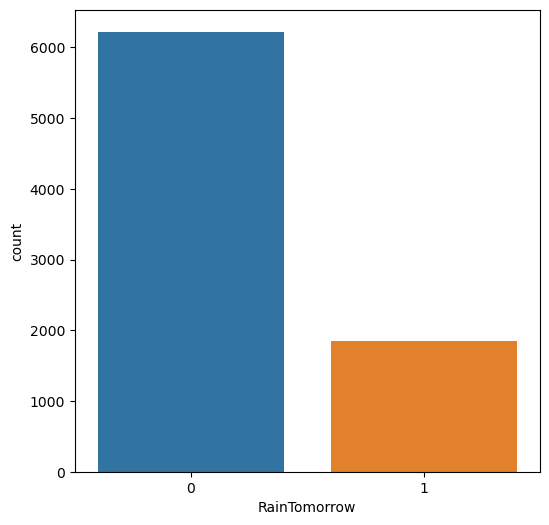

In [87]:
plt.figure(figsize=(6,6))
sns.countplot('RainTomorrow',data=df)
print(df['RainTomorrow'].value_counts())
plt.show()

We see there is a huge data imbalance, so we will balance the dataset. 

In [88]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()
x, y = sm.fit_resample(x,y)

In [89]:
print(y.value_counts())

0    6220
1    6220
Name: RainTomorrow, dtype: int64


Now we see that data is balnced, Next we will go with Train_test_split the datset.

In [90]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.metrics import f1_score, accuracy_score, classification_report, roc_curve, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier as KNN
from sklearn.svm import SVC

In [92]:
accuracy = 0
r_state =0
for i in range(1,200):
    x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.30, random_state = i)
    log = LogisticRegression()
    log.fit(x_train,y_train)
    y_pred = log.predict(x_test)
    acc = accuracy_score(y_test,y_pred)
    if acc>accuracy:
        accuracy=acc
        r_state = i
print("max accuracy score is ", accuracy , "randomstate = ",r_state)

max accuracy score is  0.7735798499464094 randomstate =  191


In [93]:
x_train,x_test,y_train,y_test = train_test_split(x,y, test_size = 0.30, random_state = 191)

In [94]:
x_train.shape

(8708, 14)

In [95]:
y_train.shape

(8708,)

In [96]:
x_test.shape

(3732, 14)

In [97]:
y_test.shape

(3732,)

In [98]:
log = LogisticRegression()
log.fit(x_train,y_train)
log_pred = log.predict(x_test)
log_pred_train = log.predict(x_train)
print("Logistic Regression")
print("Accuracy of train data is  ",accuracy_score(y_train, log_pred_train)*100, "%")
log_accu = accuracy_score(y_test, log_pred) 
print("Accuracy of test data is  ", (log_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,log_pred))
print('\n Test Classification Report \n', classification_report(y_test,log_pred))
print("****************************************")
print("\n")

rfc = RandomForestClassifier()
rfc.fit(x_train,y_train)
rfc_pred = rfc.predict(x_test)
rfc_pred_train = rfc.predict(x_train)
print("Random Forest Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, rfc_pred_train)*100, "%")
rfc_accu = accuracy_score(y_test, rfc_pred) 
print("Accuracy of test data is  ", (rfc_accu)*100,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,rfc_pred))
print('\n Test Classification Report \n', classification_report(y_test,rfc_pred))
print("****************************************")
print("\n")

bc = BaggingClassifier()
bc.fit(x_train,y_train)
bc_pred = bc.predict(x_test)
bc_pred_train = bc.predict(x_train)
print("Bagging Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, bc_pred_train)*100, "%")
bc_accu = accuracy_score(y_test, bc_pred)
print("Accuracy of test data is  ", (bc_accu)*100,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,bc_pred))
print('\n Test Classification Report \n', classification_report(y_test,bc_pred))
print("****************************************")
print("\n")

abc = AdaBoostClassifier()
abc.fit(x_train,y_train)
abc_pred = abc.predict(x_test)
abc_pred_train = abc.predict(x_train)
print("AdaBoost Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, abc_pred_train)*100, "%")
abc_accu = accuracy_score(y_test, abc_pred)
print("Accuracy of test data is  ", (abc_accu) *100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,abc_pred))
print('\n Test Classification Report \n', classification_report(y_test,abc_pred))
print("****************************************")
print("\n")

gbc = GradientBoostingClassifier()
gbc.fit(x_train,y_train)
gbc_pred = gbc.predict(x_test)
gbc_pred_train = gbc.predict(x_train)
print("Gradient Boosting Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, gbc_pred_train)*100, "%")
gbc_accu = accuracy_score(y_test, gbc_pred) 
print("Accuracy of test data is  ", (gbc_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,gbc_pred))
print('\n Test Classification Report \n', classification_report(y_test,gbc_pred))
print("****************************************")
print("\n")

etc = ExtraTreesClassifier()
etc.fit(x_train,y_train)
etc_pred = etc.predict(x_test)
etc_pred_train = etc.predict(x_train)
print("Extra Trees Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, etc_pred_train)*100, "%")
etc_accu = accuracy_score(y_test, etc_pred) 
print("Accuracy of test data is  ", (etc_accu)*100, "%")
print("\n Confusion Matrix", confusion_matrix(y_test,etc_pred))
print('\n Test Classification Report \n', classification_report(y_test,etc_pred))
print("****************************************")
print("\n")

dtc = DecisionTreeClassifier()
dtc.fit(x_train,y_train)
dtc_pred = dtc.predict(x_test)
dtc_pred_train = dtc.predict(x_train)
print("Decision Trees Classifier")
print("Accuracy of train data is  ",accuracy_score(y_train, dtc_pred_train)*100, "%")
dtc_accu = accuracy_score(y_test, dtc_pred) 
print("Accuracy of test data is  ", (dtc_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,dtc_pred))
print('\n Test Classification Report \n', classification_report(y_test,dtc_pred))
print("****************************************")
print("\n")

knn = KNN()
knn.fit(x_train,y_train)
knn_pred = knn.predict(x_test)
knn_pred_train = knn.predict(x_train)
print("K-Nearest Neighbors")
print("Accuracy of train data is  ",accuracy_score(y_train, knn_pred_train)*100, "%")
knn_accu = accuracy_score(y_test, knn_pred) 
print("Accuracy of test data is  ", (knn_accu)*100 ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test, knn_pred))
print('\n Test Classification Report \n', classification_report(y_test, knn_pred))
print("****************************************")
print("\n")


svc = SVC()
svc.fit(x_train,y_train)
svc_pred = svc.predict(x_test)
svc_pred_train = svc.predict(x_train)
print("Super-Vector Classification")
print("Accuracy of train data is  ",accuracy_score(y_train, svc_pred_train)*100 , "%")
svc_accu = accuracy_score(y_test, svc_pred) 
print("Accuracy of test data is  ", (svc_accu)*100,"%")
print("\n Confusion Matrix", confusion_matrix(y_test, svc_pred))
print('\n Test Classification Report \n', classification_report(y_test, svc_pred))
print("****************************************")
print("\n")


Logistic Regression
Accuracy of train data is   75.32154340836013 %
Accuracy of test data is   77.35798499464094 %

 Confusion Matrix [[1474  395]
 [ 450 1413]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.77      0.79      0.78      1869
           1       0.78      0.76      0.77      1863

    accuracy                           0.77      3732
   macro avg       0.77      0.77      0.77      3732
weighted avg       0.77      0.77      0.77      3732

****************************************


Random Forest Classifier
Accuracy of train data is   99.98851630684428 %
Accuracy of test data is   93.14040728831725 %

 Confusion Matrix [[1736  133]
 [ 123 1740]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.93      0.93      0.93      1869
           1       0.93      0.93      0.93      1863

    accuracy                           0.93      3732
   macro avg       0.93

In [99]:
Accuracy = pd.DataFrame({'Models':['Logistic', 'RandomForest Classifier', 'Bagging Classifier', 'AdaBoost Classifier', 'GradientBoosting','ExtraTreesClassifier','DecisionTree', 'Knn','svc'],
                          'Accuracy_score':[log_accu, rfc_accu, bc_accu,abc_accu,gbc_accu,etc_accu,dtc_accu,knn_accu,svc_accu]
                        })
Accuracy

,Models,Accuracy_score
0,Logistic,0.773580
1,RandomForest Classifier,0.931404
2,Bagging Classifier,0.903269
3,AdaBoost Classifier,0.799839
4,GradientBoosting,0.842444
5,ExtraTreesClassifier,0.939175
6,DecisionTree,0.859325
7,Knn,0.856109
8,svc,0.827706


### Cross-Validation Score

In [100]:
print('\n Logistic Regression \n')
log_score = cross_val_score(log, x, y, cv=5)
print(log_score)
print(np.mean(log_score))
log_diff = (log_accu - log_score.mean())
print(log_diff)
print("====================================\n ")


print('\n Random Forest Classifier \n')
rfc_score = cross_val_score(rfc, x, y, cv=5)
print(rfc_score)
print(np.mean(rfc_score))
rfc_diff = (rfc_accu - rfc_score.mean())
print(rfc_diff)
print("====================================\n ")


print('\n Bagging Classifier \n')
bc_score = cross_val_score(bc, x, y, cv=5)
print(bc_score)
print(np.mean(bc_score))
bc_diff = (bc_accu - bc_score.mean())
print(bc_diff)
print("====================================\n ")


print('\n AdaBoost Classifier \n')
abc_score = cross_val_score(abc, x, y, cv=5)
print(abc_score)
print(np.mean(abc_score))
abc_diff = (abc_accu - abc_score.mean())
print(abc_diff)
print("====================================\n ")

print('\n Gradient Boosting Classifier \n')
gbc_score = cross_val_score(gbc, x, y, cv=5)
print(gbc_score)
print(np.mean(gbc_score))
gbc_diff = (gbc_accu - gbc_score.mean())
print(gbc_diff)
print("====================================\n ")

print('\n ExtraTrees Classifier \n')
etc_score = cross_val_score(etc, x, y, cv=5)
print(etc_score)
print(np.mean(etc_score))
etc_diff = (etc_accu - etc_score.mean())
print(etc_diff)
print("====================================\n ")

print('\n DecisionTree Classifier \n')
dtc_score = cross_val_score(dtc, x, y, cv=5)
print(dtc_score)
print(np.mean(dtc_score))
dtc_diff = (dtc_accu - dtc_score.mean())
print(dtc_diff)
print("====================================\n ")

print('\n K-Neighbors Classifier \n')
knn_score = cross_val_score(knn, x, y, cv=5)
print(knn_score)
print(np.mean(knn_score))
knn_diff = (knn_accu - knn_score.mean())
print(knn_diff)
print("====================================\n ")

print('\n Super Vector Classifier \n')
svc_score = cross_val_score(svc, x, y, cv=5)
print(svc_score)
print(np.mean(svc_score))
svc_diff = (svc_accu - svc_score.mean())
print(svc_diff)
print("====================================\n ")


 Logistic Regression 

[0.76889068 0.70458199 0.65876206 0.75924437 0.81430868]
0.7411575562700966
0.032422293676312774
 

 Random Forest Classifier 

[0.84324759 0.74557878 0.90996785 0.91639871 0.90956592]
0.864951768488746
0.06645230439442651
 

 Bagging Classifier 

[0.82516077 0.72588424 0.88384244 0.89750804 0.87861736]
0.8422025723472668
0.06106645230439445
 

 AdaBoost Classifier 

[0.7307074  0.61254019 0.70418006 0.77210611 0.80265273]
0.7244372990353698
0.07540192926045008
 

 Gradient Boosting Classifier 

[0.75200965 0.61133441 0.7471865  0.80707395 0.83802251]
0.7511254019292604
0.09131832797427664
 

 ExtraTrees Classifier 

[0.87299035 0.79501608 0.92282958 0.92966238 0.90996785]
0.8860932475884244
0.05308145766345118
 

 DecisionTree Classifier 

[0.75040193 0.74155949 0.87982315 0.8488746  0.81752412]
0.807636655948553
0.0516881028938907
 

 K-Neighbors Classifier 

[0.80827974 0.70418006 0.80707395 0.82676849 0.81752412]
0.7927652733118972
0.06334405144694533
 

 Su

In [101]:
CV_data = pd.DataFrame({'Models':['Logistic', 'RandomForest Classifier', 'Bagging Classifier', 'AdaBoost Classifier', 'GradientBoosting','ExtraTreesClassifier','DecisionTree', 'Knn','svc'],
                        'Accuracy_score':[log_accu, rfc_accu, bc_accu,abc_accu,gbc_accu,etc_accu,dtc_accu,knn_accu,svc_accu],
                        'Diff_score':[log_diff, rfc_diff, bc_diff,abc_diff,gbc_diff,etc_diff,dtc_diff,knn_diff,svc_diff]
                        })
CV_data

,Models,Accuracy_score,Diff_score
0,Logistic,0.773580,0.032422
1,RandomForest Classifier,0.931404,0.066452
2,Bagging Classifier,0.903269,0.061066
3,AdaBoost Classifier,0.799839,0.075402
4,GradientBoosting,0.842444,0.091318
5,ExtraTreesClassifier,0.939175,0.053081
6,DecisionTree,0.859325,0.051688
7,Knn,0.856109,0.063344
8,svc,0.827706,0.067497


We see that LogisticRegression and Decision Trees are having least diference so we will tune for these two models.

### Hyper-parameter Tuning

#### LogisticRegression_Parameter Tuning.

In [102]:
param_grid_log = {"penalty":['l1','l2','elasticnet'],"fit_intercept":['True','False'], "solver":['liblinear','sag','saga','lbfgs'] }

In [103]:
RainTomorrow1 = GridSearchCV(LogisticRegression(), param_grid_log, cv=5)
RainTomorrow1.fit(x_train,y_train)
best_parameters=RainTomorrow1.best_params_
print(best_parameters)
best_result=RainTomorrow1.best_score_
print(best_result*100)

{'fit_intercept': 'True', 'penalty': 'l2', 'solver': 'liblinear'}
75.3099324655387


In [104]:
RainTomorrow1 = LogisticRegression(fit_intercept= 'True',penalty='l2',solver = 'liblinear')

In [105]:
RainTomorrow1.fit(x_train,y_train)
RainTomorrow1_pred = RainTomorrow1.predict(x_test)
RainTomorrow1_accu = accuracy_score(y_test,RainTomorrow1_pred) * 100
print(f"Accuracy Score of test data is: ",RainTomorrow1_accu ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,RainTomorrow1_pred))
print('\n Test Classification Report \n', classification_report(y_test,RainTomorrow1_pred))

Accuracy Score of test data is:  77.35798499464094 %

 Confusion Matrix [[1474  395]
 [ 450 1413]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.77      0.79      0.78      1869
           1       0.78      0.76      0.77      1863

    accuracy                           0.77      3732
   macro avg       0.77      0.77      0.77      3732
weighted avg       0.77      0.77      0.77      3732



We dont ssee much increase in the accuracy after tuning the parameters, next we will check for decision tree classifiers

#### Decision TRee Classsifier

In [106]:
param_grid_dtc = {"criterion":['gini','entropy','log_los'], "max_depth":[10,20,30],
              "max_features":['auto','sqrt','log2'], "random_state":[10,30,40]   
             }

In [107]:
RainTomorrow2 = GridSearchCV(DecisionTreeClassifier(), param_grid_dtc, cv=5)
RainTomorrow2.fit(x_train,y_train)
best_parameters=RainTomorrow2.best_params_
print(best_parameters)
best_result=RainTomorrow2.best_score_
print(best_result*100)

{'criterion': 'gini', 'max_depth': 30, 'max_features': 'auto', 'random_state': 30}
83.86543621748986


In [152]:
RainTomorrow2 = DecisionTreeClassifier(criterion='gini', max_depth = 60, max_features = 'auto', random_state = 30)

In [153]:
RainTomorrow2.fit(x_train,y_train)
RainTomorrow2_pred = RainTomorrow2.predict(x_test)
RainTomorrow2_accu = accuracy_score(y_test,RainTomorrow2_pred) * 100
print(f"Accuracy Score of test data is: ",RainTomorrow2_accu ,"%")
print("\n Confusion Matrix", confusion_matrix(y_test,RainTomorrow2_pred))
print('\n Test Classification Report \n', classification_report(y_test,RainTomorrow2_pred))

Accuracy Score of test data is:  86.41479099678456 %

 Confusion Matrix [[1625  244]
 [ 263 1600]]

 Test Classification Report 
               precision    recall  f1-score   support

           0       0.86      0.87      0.87      1869
           1       0.87      0.86      0.86      1863

    accuracy                           0.86      3732
   macro avg       0.86      0.86      0.86      3732
weighted avg       0.86      0.86      0.86      3732



### We see that there is slight increase in accuracy after tuning parameters  tried with multiple combinations like changing the max-depth and random state, there is no such huge change or increase with other values for max-depth and random state so we consider the above parameters and decision tree classifier as the best model.

#### Before Tuning: 85.9%
#### After Tuning: 86.41%

In [154]:
import joblib
joblib.dump(RainTomorrow2 ,"Rain_Tomorrow_prediction.pkl")

['Rain_Tomorrow_prediction.pkl']

In [155]:
RainTomorrow_model = joblib.load("Rain_Tomorrow_prediction.pkl")
result = RainTomorrow_model.score(x_test,y_test)
print(result)

0.8641479099678456


In [156]:
Rain_Tomorrow_df = pd.DataFrame({'Actual':y_test , 'Predicted':RainTomorrow2_pred},columns=['Actual','Predicted'])
Rain_Tomorrow_df.sample(25)

,Actual,Predicted
4604,0,0
8621,1,1
9475,1,1
10317,1,1
10098,1,1
4865,1,1
11254,1,1
8633,1,1
12323,1,1
8211,1,1


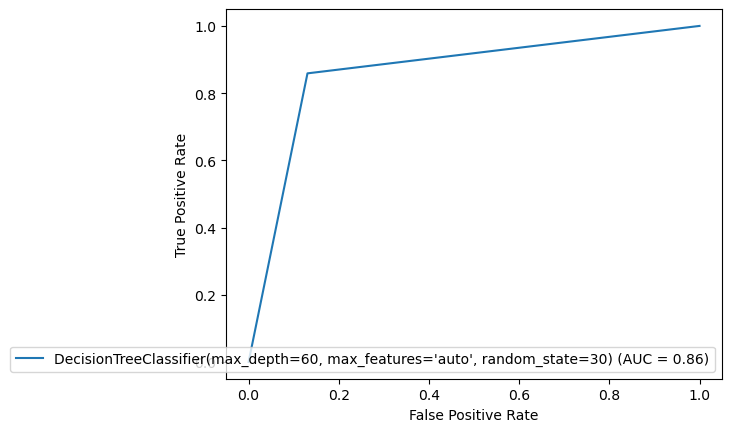

In [158]:
# Plot AUC_ROC curve

from sklearn import metrics
fpr,tpr,thresholds = metrics.roc_curve(y_test,RainTomorrow2_pred)
roc_auc = metrics.auc(fpr,tpr)
display = metrics.RocCurveDisplay(fpr = fpr, tpr = tpr, roc_auc=roc_auc,estimator_name=RainTomorrow2)
display.plot()

### Rainfall Prediction

In [160]:
df

,MinTemp,MaxTemp,Rainfall,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,13.4,22.900000,0.151560,3.378077,14.718234,13,44.000000,13,14,0,0,22.0,46.5,6.251591,19.35,1007.40
1,7.4,25.100000,-0.000000,3.378077,14.718234,14,44.000000,6,15,0,0,13.0,34.5,4.534902,20.75,1009.20
2,12.9,25.700000,-0.000000,3.378077,14.718234,15,46.000000,13,15,0,0,22.5,34.0,3.283311,22.10,1008.15
3,9.2,28.000000,-0.000000,3.378077,14.718234,4,24.000000,9,0,0,0,10.0,30.5,4.534902,22.30,1015.20
4,17.5,32.300000,0.164625,3.378077,14.718234,13,41.000000,1,7,0,0,13.5,57.5,7.500000,23.75,1008.40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8420,2.8,23.400000,-0.000000,3.378077,14.718234,0,31.000000,9,1,0,0,12.0,37.5,4.534902,16.25,1022.45
8421,3.6,25.300000,-0.000000,3.378077,14.718234,6,22.000000,9,3,0,0,11.0,38.5,4.534902,17.70,1021.30
8422,5.4,26.900000,-0.000000,3.378077,14.718234,3,37.000000,9,14,0,0,9.0,38.5,4.534902,19.30,1018.90
8423,7.8,27.000000,-0.000000,3.378077,14.718234,9,28.000000,10,3,0,0,10.0,37.5,2.500000,20.55,1017.95


We see this data after removing skewness, outliers, unwanted columns.So next we will scale the values and check for Multicollinearity and then build the model

### Standard Scaler

In [161]:
x1 = df.drop(columns = ['Rainfall'], axis = 1)
y1 = df['Rainfall']

In [162]:
x1.shape

(8064, 15)

In [164]:
y1.shape

(8064,)

In [166]:
sr = StandardScaler()
x1 = pd.DataFrame(sr.fit_transform(x1), columns = x1.columns)
x1

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Temp,Avg_Pressure
0,0.053772,-0.150131,0.181193,-0.09805,1.233582,0.352079,1.256877,1.400197,-0.541229,-0.544484,0.744235,-0.830152,0.833218,-0.127483,-1.542502
1,-1.060593,0.214020,0.181193,-0.09805,1.446370,0.352079,-0.273201,1.626646,-0.541229,-0.544484,-0.339245,-1.596501,0.012891,0.127305,-1.240065
2,-0.039092,0.313334,0.181193,-0.09805,1.659158,0.507491,1.256877,1.626646,-0.541229,-0.544484,0.804429,-1.628432,-0.585187,0.372992,-1.416487
3,-0.726283,0.694038,0.181193,-0.09805,-0.681506,-1.202039,0.382547,-1.770086,-0.541229,-0.544484,-0.700405,-1.851951,0.012891,0.409390,-0.231940
4,0.815254,1.405788,0.181193,-0.09805,1.233582,0.118962,-1.366114,-0.184944,-0.541229,-0.544484,-0.279052,-0.127665,1.429775,0.673277,-1.374482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059,-1.914939,-0.067369,0.181193,-0.09805,-1.532657,-0.658098,0.382547,-1.543638,-0.541229,-0.544484,-0.459632,-1.404914,0.012891,-0.691655,0.986211
8060,-1.766357,0.247125,0.181193,-0.09805,-0.255931,-1.357451,0.382547,-1.090740,-0.541229,-0.544484,-0.580018,-1.341051,0.012891,-0.427768,0.792987
8061,-1.432047,0.511962,0.181193,-0.09805,-0.894294,-0.191862,0.382547,1.400197,-0.541229,-0.544484,-0.820792,-1.341051,0.012891,-0.136582,0.389737
8062,-0.986302,0.528515,0.181193,-0.09805,0.382432,-0.891215,0.601129,-1.090740,-0.541229,-0.544484,-0.700405,-1.404914,-0.959496,0.090906,0.230117


Now we have scaled the data, next we will check for multicollinearity

In [167]:
vif = pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x1.values, i) for i in range(len(x1.columns))]
vif['Features'] = x1.columns

vif

,VIF Values,Features
0,6.969776,MinTemp
1,17.817168,MaxTemp
2,1.498841,Evaporation
3,2.036986,Sunshine
4,1.569334,WindGustDir
5,2.326857,WindGustSpeed
6,1.311297,WindDir9am
7,1.406548,WindDir3pm
8,1.303525,RainToday
9,1.370077,RainTomorrow


We will drop avg_temp since it has high vif value.

In [168]:
x1.drop("Avg_Temp",axis=1,inplace=True)
x1

,MinTemp,MaxTemp,Evaporation,Sunshine,WindGustDir,WindGustSpeed,WindDir9am,WindDir3pm,RainToday,RainTomorrow,Avg_WindSpeed,Avg_Humidity,Avg_Cloud,Avg_Pressure
0,0.053772,-0.150131,0.181193,-0.09805,1.233582,0.352079,1.256877,1.400197,-0.541229,-0.544484,0.744235,-0.830152,0.833218,-1.542502
1,-1.060593,0.214020,0.181193,-0.09805,1.446370,0.352079,-0.273201,1.626646,-0.541229,-0.544484,-0.339245,-1.596501,0.012891,-1.240065
2,-0.039092,0.313334,0.181193,-0.09805,1.659158,0.507491,1.256877,1.626646,-0.541229,-0.544484,0.804429,-1.628432,-0.585187,-1.416487
3,-0.726283,0.694038,0.181193,-0.09805,-0.681506,-1.202039,0.382547,-1.770086,-0.541229,-0.544484,-0.700405,-1.851951,0.012891,-0.231940
4,0.815254,1.405788,0.181193,-0.09805,1.233582,0.118962,-1.366114,-0.184944,-0.541229,-0.544484,-0.279052,-0.127665,1.429775,-1.374482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8059,-1.914939,-0.067369,0.181193,-0.09805,-1.532657,-0.658098,0.382547,-1.543638,-0.541229,-0.544484,-0.459632,-1.404914,0.012891,0.986211
8060,-1.766357,0.247125,0.181193,-0.09805,-0.255931,-1.357451,0.382547,-1.090740,-0.541229,-0.544484,-0.580018,-1.341051,0.012891,0.792987
8061,-1.432047,0.511962,0.181193,-0.09805,-0.894294,-0.191862,0.382547,1.400197,-0.541229,-0.544484,-0.820792,-1.341051,0.012891,0.389737
8062,-0.986302,0.528515,0.181193,-0.09805,0.382432,-0.891215,0.601129,-1.090740,-0.541229,-0.544484,-0.700405,-1.404914,-0.959496,0.230117


In [169]:
vif = pd.DataFrame()
vif['VIF Values']=[variance_inflation_factor(x1.values, i) for i in range(len(x1.columns))]
vif['Features'] = x1.columns

vif

,VIF Values,Features
0,3.663786,MinTemp
1,4.651603,MaxTemp
2,1.498559,Evaporation
3,2.029012,Sunshine
4,1.569119,WindGustDir
5,2.289249,WindGustSpeed
6,1.311280,WindDir9am
7,1.404335,WindDir3pm
8,1.303249,RainToday
9,1.368806,RainTomorrow


So now we have removed the multicollinearity, Next we will build the model.

In [170]:
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV
from sklearn.linear_model import LinearRegression, Lasso, Ridge
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor, ExtraTreesRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.neighbors import KNeighborsRegressor as KNN
from sklearn.svm import SVR
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

In [172]:
accuracy = 0
r_state =0
for i in range(1,200):
    x_train_1,x_test_1,y_train_1,y_test_1 = train_test_split(x1, y1, test_size = 0.30, random_state = i)
    lr = LinearRegression()
    lr.fit(x_train_1,y_train_1)
    y_pred_1 = lr.predict(x_test_1)
    acc = r2_score(y_test_1,y_pred_1)
    if acc>accuracy:
        accuracy=acc
        r_state = i
print("maximum r2 score is ", accuracy , "at randomstate = ",r_state)

maximum r2 score is  0.7055620618676056 at randomstate =  69


In [173]:
x_train_1,x_test_1,y_train_1,y_test_1 = train_test_split(x1, y1, test_size = 0.30, random_state = 69)

In [174]:
lr = LinearRegression()
lr.fit(x_train_1,y_train_1)
lr_pred = lr.predict(x_test_1)
lr_pred_train = lr.predict(x_train_1)
lr_r2_train = r2_score(y_train_1, lr_pred_train)
lr_r2 = r2_score(y_test_1, lr_pred)
lr_mae = mean_absolute_error(y_test_1, lr_pred)
lr_mse = mean_squared_error(y_test_1, lr_pred)
lr_rmse = np.sqrt(mean_squared_error(y_test_1, lr_pred))
print("Linear Regression")
print("r2Score of train data is  ",lr_r2_train)
print("r2Score of test data is  ",lr_r2)
print("Mean absolute error of test data is  ", lr_mae)
print("Mean squared error of test data is  ", lr_mse)
print("Root Mean squared error of test data is  ", lr_rmse)
print("\n\n")


ls = Lasso()
ls.fit(x_train_1,y_train_1)
ls_pred = ls.predict(x_test_1)
ls_pred_train = ls.predict(x_train_1)
ls_r2_train = r2_score(y_train_1, ls_pred_train)
ls_r2 = r2_score(y_test_1, ls_pred)
ls_mae = mean_absolute_error(y_test_1, ls_pred)
ls_mse = mean_squared_error(y_test_1, ls_pred)
ls_rmse = np.sqrt(mean_squared_error(y_test_1, ls_pred))
print("Lasso Regression")
print("r2Score of train data is  ",ls_r2_train)
print("r2Score of test data is  ",ls_r2)
print("Mean absolute error of test data is  ", ls_mae)
print("Mean squared error of test data is  ", ls_mse)
print("Root Mean squared error of test data is  ", ls_rmse)
print("\n\n")

rg = Ridge()
rg.fit(x_train_1,y_train_1)
rg_pred = rg.predict(x_test_1)
rg_pred_train = rg.predict(x_train_1)
rg_r2_train = r2_score(y_train_1, rg_pred_train)
rg_r2 = r2_score(y_test_1, rg_pred)
rg_mae = mean_absolute_error(y_test_1, rg_pred)
rg_mse = mean_squared_error(y_test_1, rg_pred)
rg_rmse = np.sqrt(mean_squared_error(y_test_1, rg_pred))
print("Ridge Regression")
print("r2Score of train data is  ",rg_r2_train)
print("r2Score of test data is  ",rg_r2)
print("Mean absolute error of test data is  ", rg_mae)
print("Mean squared error of test data is  ", rg_mse)
print("Root Mean squared error of test data is  ", rg_rmse)
print("\n\n")

gbr = GradientBoostingRegressor()
gbr.fit(x_train_1,y_train_1)
gbr_pred = gbr.predict(x_test_1)
gbr_pred_train = gbr.predict(x_train_1)
gbr_r2_train = r2_score(y_train_1, gbr_pred_train)
gbr_r2 = r2_score(y_test_1, gbr_pred)
gbr_mae = mean_absolute_error(y_test_1, gbr_pred)
gbr_mse = mean_squared_error(y_test_1, gbr_pred)
gbr_rmse = np.sqrt(mean_squared_error(y_test_1, gbr_pred))
print("Gradient Boosting Regressor")
print("r2Score of train data is  ",gbr_r2_train)
print("r2Score of test data is  ",gbr_r2)
print("Mean absolute error of test data is  ", gbr_mae)
print("Mean squared error of test data is  ", gbr_mse)
print("Root Mean squared error of test data is  ", gbr_rmse)
print("\n\n")

abr = AdaBoostRegressor()
abr.fit(x_train_1,y_train_1)
abr_pred = abr.predict(x_test_1)
abr_pred_train = abr.predict(x_train_1)
abr_r2_train = r2_score(y_train_1, abr_pred_train)
abr_r2 = r2_score(y_test_1, abr_pred)
abr_mae = mean_absolute_error(y_test_1, abr_pred)
abr_mse = mean_squared_error(y_test_1, abr_pred)
abr_rmse = np.sqrt(mean_squared_error(y_test_1, abr_pred))
print("Ada Boosting Regressor")
print("r2Score of train data is  ",abr_r2_train)
print("r2Score of test data is  ",abr_r2)
print("Mean absolute error of test data is  ", abr_mae)
print("Mean squared error of test data is  ", abr_mse)
print("Root Mean squared error of test data is  ", abr_rmse)
print("\n\n")

rfr = RandomForestRegressor()
rfr.fit(x_train_1,y_train_1)
rfr_pred = rfr.predict(x_test_1)
rfr_pred_train = rfr.predict(x_train_1)
rfr_r2_train = r2_score(y_train_1, rfr_pred_train)
rfr_r2 = r2_score(y_test_1, rfr_pred)
rfr_mae = mean_absolute_error(y_test_1, rfr_pred)
rfr_mse = mean_squared_error(y_test_1, rfr_pred)
rfr_rmse = np.sqrt(mean_squared_error(y_test_1, rfr_pred))
print("Random Forest Regressor")
print("r2Score of train data is  ",rfr_r2_train)
print("r2Score of test data is  ",rfr_r2)
print("Mean absolute error of test data is  ", rfr_mae)
print("Mean squared error of test data is  ", rfr_mse)
print("Root Mean squared error of test data is  ", rfr_rmse)
print("\n\n")

etr = ExtraTreesRegressor()
etr.fit(x_train_1,y_train_1)
etr_pred = etr.predict(x_test_1)
etr_pred_train = etr.predict(x_train_1)
etr_r2_train = r2_score(y_train_1, etr_pred_train)
etr_r2 = r2_score(y_test_1, etr_pred)
etr_mae = mean_absolute_error(y_test_1, etr_pred)
etr_mse = mean_squared_error(y_test_1, etr_pred)
etr_rmse = np.sqrt(mean_squared_error(y_test_1, etr_pred))
print("Extra Trees Regressor")
print("r2Score of train data is  ",etr_r2_train)
print("r2Score of test data is  ",etr_r2)
print("Mean absolute error of test data is  ", etr_mae)
print("Mean squared error of test data is  ", etr_mse)
print("Root Mean squared error of test data is  ", etr_rmse)
print("\n\n")

dtr = DecisionTreeRegressor()
dtr.fit(x_train_1,y_train_1)
dtr_pred = dtr.predict(x_test_1)
dtr_pred_train = dtr.predict(x_train_1)
dtr_r2_train = r2_score(y_train_1, dtr_pred_train)
dtr_r2 = r2_score(y_test_1, dtr_pred)
dtr_mae = mean_absolute_error(y_test_1, dtr_pred)
dtr_mse = mean_squared_error(y_test_1, dtr_pred)
dtr_rmse = np.sqrt(mean_squared_error(y_test_1, dtr_pred))
print("Decision Tree Regressor")
print("r2Score of train data is  ",dtr_r2_train)
print("r2Score of test data is  ",dtr_r2)
print("Mean absolute error of test data is  ", dtr_mae)
print("Mean squared error of test data is  ", dtr_mse)
print("Root Mean squared error of test data is  ", dtr_rmse)
print("\n\n")

knn = KNN()
knn.fit(x_train_1,y_train_1)
knn_pred = knn.predict(x_test_1)
knn_pred_train = knn.predict(x_train_1)
knn_r2_train = r2_score(y_train_1, knn_pred_train)
knn_r2 = r2_score(y_test_1, knn_pred)
knn_mae = mean_absolute_error(y_test_1, knn_pred)
knn_mse = mean_squared_error(y_test_1, knn_pred)
knn_rmse = np.sqrt(mean_squared_error(y_test_1, knn_pred))
print("K-Nearest Neighbor")
print("r2Score of train data is  ",knn_r2_train)
print("r2Score of test data is  ",knn_r2)
print("Mean absolute error of test data is  ", knn_mae)
print("Mean squared error of test data is  ", knn_mse)
print("Root Mean squared error of test data is  ", knn_rmse)
print("\n\n")


svr = SVR()
svr.fit(x_train_1,y_train_1)
svr_pred = svr.predict(x_test_1)
svr_pred_train = svr.predict(x_train_1)
svr_r2_train = r2_score(y_train_1, svr_pred_train)
svr_r2 = r2_score(y_test_1, svr_pred)
svr_mae = mean_absolute_error(y_test_1, svr_pred)
svr_mse = mean_squared_error(y_test_1, svr_pred)
svr_rmse = np.sqrt(mean_squared_error(y_test_1, svr_pred))
print("Super Vector Regressor")
print("r2Score of train data is  ",svr_r2_train)
print("r2Score of test data is  ",svr_r2)
print("Mean absolute error of test data is  ", svr_mae)
print("Mean squared error of test data is  ", svr_mse)
print("Root Mean squared error of test data is  ", svr_rmse)
print("\n\n")

Linear Regression
r2Score of train data is   0.6680306602686378
r2Score of test data is   0.7055620618676056
Mean absolute error of test data is   0.02970404054087561
Mean squared error of test data is   0.0018688186374794353
Root Mean squared error of test data is   0.04322983503877195



Lasso Regression
r2Score of train data is   0.0
r2Score of test data is   -0.001446835480824582
Mean absolute error of test data is   0.07524782373663273
Mean squared error of test data is   0.006356254640493489
Root Mean squared error of test data is   0.07972612269823166



Ridge Regression
r2Score of train data is   0.6680306421381446
r2Score of test data is   0.7055567164193672
Mean absolute error of test data is   0.029706937485853676
Mean squared error of test data is   0.0018688525654214562
Root Mean squared error of test data is   0.04323022745049413



Gradient Boosting Regressor
r2Score of train data is   0.7269042133863111
r2Score of test data is   0.7287223821032159
Mean absolute error of

In [175]:
accuracy_data = pd.DataFrame({'Models':['Linear','Lasso','Ridge', 'GradientBoosting','AdaBoostRegressor','ExtraTreesRegressor','RandomForest','DecisionTree', 'Knn','svr'],
                          'r-square_train':[lr_r2_train, ls_r2_train,rg_r2_train,gbr_r2_train,abr_r2_train, etr_r2_train, rfr_r2_train, dtr_r2_train,knn_r2_train,svr_r2_train],
                          'r-square_test':[lr_r2, ls_r2,rg_r2,gbr_r2,abr_r2, etr_r2, rfr_r2, dtr_r2,knn_r2,svr_r2],    
                          'mae_score':[lr_mae, ls_mae,rg_mae,gbr_mae,abr_mae, etr_mae, rfr_mae, dtr_mae,knn_mae,svr_mae],
                          'mse_score':[lr_mse, ls_mse,rg_mse,gbr_mse,abr_mse,etr_mse,rfr_mse, dtr_mse,knn_mse,svr_mse],
                          'rmse_score':[lr_rmse, ls_rmse,rg_rmse,gbr_rmse,abr_rmse,etr_rmse,rfr_rmse,dtr_rmse,knn_rmse,svr_rmse]})
accuracy_data

,Models,r-square_train,r-square_test,mae_score,mse_score,rmse_score
0,Linear,0.668031,0.705562,0.029704,0.001869,0.043230
1,Lasso,0.000000,-0.001447,0.075248,0.006356,0.079726
2,Ridge,0.668031,0.705557,0.029707,0.001869,0.043230
3,GradientBoosting,0.726904,0.728722,0.026881,0.001722,0.041495
4,AdaBoostRegressor,0.648461,0.666287,0.034309,0.002118,0.046023
5,ExtraTreesRegressor,0.999221,0.817781,0.017742,0.001157,0.034008
6,RandomForest,0.967749,0.798429,0.021253,0.001279,0.035769
7,DecisionTree,0.999221,0.592916,0.019282,0.002584,0.050831
8,Knn,0.783598,0.685646,0.025322,0.001995,0.044668
9,svr,-0.147513,-0.179899,0.084754,0.007489,0.086538


### Cross-Validation Score

In [176]:
#linear Regression
lr_score = cross_val_score(lr, x1, y1, cv=5)
print("Linear Regression")
print(lr_score)
lr_mean = np.mean(lr_score)
print(lr_mean)
lr_diff = (lr_r2 - lr_score.mean())
print(lr_diff)
print("\n")

#Lasso Regression
ls_score = cross_val_score(ls, x1, y1, cv=5)
print("Lasso Regression")
print(ls_score)
ls_mean = np.mean(ls_score)
print(ls_mean)
ls_diff = (ls_r2 - ls_score.mean())
print(ls_diff)
print("\n")

#Ridge Regression
rg_score = cross_val_score(rg, x1, y1, cv=5)
print("Ridge Regression")
print(rg_score)
rg_mean = np.mean(rg_score)
print(rg_mean)
rg_diff = (rg_r2 - rg_score.mean())
print(rg_diff)
print("\n")

#Gradient Boosting Regression
gbr_score = cross_val_score(gbr, x1, y1, cv=5)
print("Gradient Boosting Regression")
print(gbr_score)
gbr_mean = np.mean(gbr_score)
print(gbr_mean)
gbr_diff = (gbr_r2 - gbr_score.mean())
print(gbr_diff)
print("\n")

#AdaBoost Regression
abr_score = cross_val_score(abr, x1, y1, cv=5)
print("Ada Boosting Regression")
print(abr_score)
abr_mean = np.mean(abr_score)
print(abr_mean)
abr_diff = (abr_r2 - abr_score.mean())
print(abr_diff)
print("\n")

#Extra Trees Regression
etr_score = cross_val_score(etr, x1, y1, cv=5)
print("Extra Trees Regression")
print(etr_score)
etr_mean = np.mean(etr_score)
print(etr_mean)
etr_diff = (etr_r2 - etr_score.mean())
print(etr_diff)
print("\n")

#Random Forest Regression
rfr_score = cross_val_score(rfr, x1, y1, cv=5)
print("Random forest Regression")
print(rfr_score)
rfr_mean = np.mean(rfr_score)
print(rfr_mean)
rfr_diff = (rfr_r2 - rfr_score.mean())
print(rfr_diff)
print("\n")

#Decision trees Regression
dtr_score = cross_val_score(dtr, x1, y1, cv=5)
print("Decision trees Regression")
print(dtr_score)
dtr_mean = np.mean(dtr_score)
print(dtr_mean)
dtr_diff = (dtr_r2 - dtr_score.mean())
print(dtr_diff)
print("\n")

#KNN Regression
knn_score = cross_val_score(knn, x1, y1, cv=5)
print("KNN Regression")
print(knn_score)
knn_mean = np.mean(knn_score)
print(knn_mean)
knn_diff = (knn_r2 - knn_score.mean())
print(knn_diff)
print("\n")

#Super Vector Regression
svr_score = cross_val_score(svr, x1, y1, cv=5)
print("Super Vector Regression")
print(svr_score)
svr_mean = np.mean(svr_score)
print(svr_mean)
svr_diff = (svr_r2 - svr_score.mean())
print(svr_diff)
print("\n")

Linear Regression
[0.74847359 0.60545645 0.64928134 0.58117736 0.77765613]
0.6724089730374118
0.033153088830193855


Lasso Regression
[-0.00560535 -0.0142705  -0.00726001 -0.02115384 -0.09877658]
-0.029413257082617595
0.027966421601793013


Ridge Regression
[0.74846479 0.60546232 0.64927647 0.58120004 0.77764955]
0.6724106347647953
0.03314608165457189


Gradient Boosting Regression
[0.74895295 0.63561872 0.66134704 0.59558462 0.78719186]
0.6857390416959712
0.04298334040724472


Ada Boosting Regression
[0.62573259 0.57279742 0.61138599 0.58515653 0.6944513 ]
0.6179047674741662
0.04838242784069058


Extra Trees Regression
[0.71560589 0.7466122  0.85977692 0.69613472 0.76532756]
0.7566914583972094
0.06108983539003299


Random forest Regression
[0.71847692 0.73005039 0.81737261 0.66929538 0.73947248]
0.7349335548244105
0.06349512933628854


Decision trees Regression
[0.24864484 0.57504869 0.65554622 0.53455795 0.22935972]
0.44863148452068524
0.14428495063002256


KNN Regression
[0.63322611

In [177]:
Cross_val_data = pd.DataFrame({'Models':['Linear','Lasso','Ridge', 'GradientBoosting','Ada Boost','ExtraTrees Regressor','RandomForest','DecisionTree', 'Knn','svr'],
                                'r-square_train':[lr_r2_train, ls_r2_train,rg_r2_train,gbr_r2_train,abr_r2_train, etr_r2_train, rfr_r2_train, dtr_r2_train,knn_r2_train,svr_r2_train],
                               'r-square_test':[lr_r2, ls_r2,rg_r2,gbr_r2,abr_r2, etr_r2, rfr_r2, dtr_r2,knn_r2,svr_r2], 
                               'CV_mean':[lr_mean, ls_mean,rg_mean,gbr_mean,abr_mean, etr_mean, rfr_mean, dtr_mean,knn_mean,svr_mean], 
                              'diff_cv_r2':[lr_diff, ls_diff,rg_diff,gbr_diff,abr_diff,etr_diff,rfr_diff, dtr_diff,knn_diff,svr_diff]})
Cross_val_data

,Models,r-square_train,r-square_test,CV_mean,diff_cv_r2
0,Linear,0.668031,0.705562,0.672409,0.033153
1,Lasso,0.000000,-0.001447,-0.029413,0.027966
2,Ridge,0.668031,0.705557,0.672411,0.033146
3,GradientBoosting,0.726904,0.728722,0.685739,0.042983
4,Ada Boost,0.648461,0.666287,0.617905,0.048382
5,ExtraTrees Regressor,0.999221,0.817781,0.756691,0.061090
6,RandomForest,0.967749,0.798429,0.734934,0.063495
7,DecisionTree,0.999221,0.592916,0.448631,0.144285
8,Knn,0.783598,0.685646,0.630216,0.055430
9,svr,-0.147513,-0.179899,-0.190004,0.010105


We see that LInear Regression and Gradient Boosting are giving good r2 score as well as cv score is also less, so we consider these both for Model BUilding.

In [178]:
param_grid_linear = {'fit_intercept':[True,False], 'copy_X':[True], 'n_jobs':[-1], 'positive' : [True]}

In [179]:
gd_linear = GridSearchCV(LinearRegression(), param_grid_linear, cv=5)
gd_linear.fit(x_train_1,y_train_1)


best_parameters=gd_linear.best_params_
print(best_parameters)
best_result=gd_linear.best_score_
print(best_result*100)

{'copy_X': True, 'fit_intercept': True, 'n_jobs': -1, 'positive': True}
66.11790865671544


In [180]:
Rainfall_linear = LinearRegression(copy_X='True', fit_intercept='True', n_jobs=-1, positive='True')

In [181]:
Rainfall_linear.fit(x_train_1,y_train_1)
Rainfall_linear_pred = Rainfall_linear.predict(x_test_1)
Rainfall_linear_r2 = r2_score(y_test_1, Rainfall_linear_pred)
Rainfall_linear_mae = mean_absolute_error(y_test_1, Rainfall_linear_pred)
Rainfall_linear_mse = mean_squared_error(y_test_1, Rainfall_linear_pred)
Rainfall_linear_rmse = np.sqrt(mean_squared_error(y_test_1, Rainfall_linear_pred))

print("r2Score of test data is  ",Rainfall_linear_r2)
print("Mean absolute error of test data is  ", Rainfall_linear_mae)
print("Mean squared error of test data is  ", Rainfall_linear_mse)
print("Root Mean squared error of test data is  ", Rainfall_linear_rmse)
print("\n")

r2Score of test data is   0.70154082675763
Mean absolute error of test data is   0.02980749191956716
Mean squared error of test data is   0.0018943417041293253
Root Mean squared error of test data is   0.043524035935668066




### Gradient Boosting Regressor

In [182]:
param_grid_gbr = {"n_estimators": [30,32,38], "learning_rate" :[0.001,0.01, 0.1], 
                  "max_depth":[8,10,12,14],"criterion":['friedman_mse','squared_error'],"max_features":['sqrt','log2']}

In [227]:
gd_gbr = GridSearchCV(GradientBoostingRegressor(), param_grid_gbr, cv=5)
gd_gbr.fit(x_train_1,y_train_1)


best_parameters=gd_gbr.best_params_
print(best_parameters)
best_result=gd_gbr.best_score_
print(best_result*100)

{'criterion': 'squared_error', 'learning_rate': 0.1, 'max_depth': 14, 'max_features': 'sqrt', 'n_estimators': 38}
76.2872979305509


In [228]:
Rainfall2 = GradientBoostingRegressor(criterion='squared_error', learning_rate=0.1, max_depth=14, max_features='sqrt', n_estimators=38)

In [229]:
Rainfall2.fit(x_train_1,y_train_1)
Rainfall2_pred = Rainfall2.predict(x_test_1)
Rainfall2_r2 = r2_score(y_test_1, Rainfall2_pred)
Rainfall2_mae = mean_absolute_error(y_test_1, Rainfall2_pred)
Rainfall2_mse = mean_squared_error(y_test_1, Rainfall2_pred)
Rainfall2_rmse = np.sqrt(mean_squared_error(y_test_1, Rainfall2_pred))

print("r2Score of test data is  ",Rainfall2_r2)
print("Mean absolute error of test data is  ", Rainfall2_mae)
print("Mean squared error of test data is  ", Rainfall2_mse)
print("Root Mean squared error of test data is  ",Rainfall2_rmse)
print("\n")

r2Score of test data is   0.8050510733047507
Mean absolute error of test data is   0.0197584880587645
Mean squared error of test data is   0.0012373547711805918
Root Mean squared error of test data is   0.035176053945554946




### We see that for gradient boosting regressor before tuning the parameter it was 72% and after tuning it has increased to 80.8%. So we consider gradient boosting model as best and accurate model for predicting Rainfall for next day and we will save this model.

In [232]:
Rainfall_df = pd.DataFrame({'Actual':y_test_1 , 'Predicted':Rainfall2_pred},columns=['Actual','Predicted'])
Rainfall_df.head(25)

,Actual,Predicted
1546,-0.000000,-0.005514
3642,-0.000000,0.003409
3924,-0.000000,0.002006
3282,-0.000000,0.044647
2709,0.103861,0.049201
6698,-0.000000,0.002456
2369,-0.000000,0.012211
2330,-0.000000,0.014004
4367,0.180368,0.178143
4721,0.179521,0.177051


<AxesSubplot:xlabel='Rainfall', ylabel='Density'>

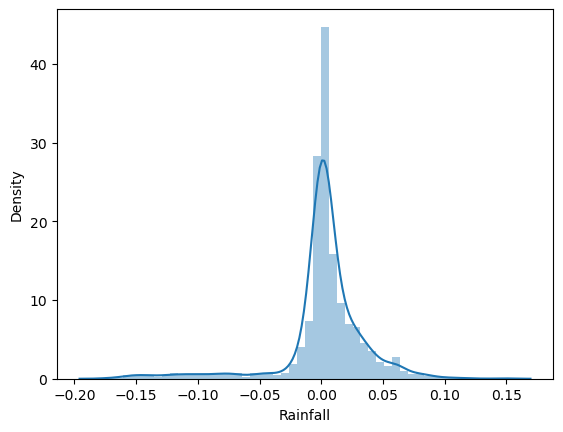

In [231]:
sns.distplot(Rainfall2.predict(x_test_1) - y_test_1)

In [233]:
import joblib
joblib.dump(Rainfall2,'Rainfall_prediction.pkl')

['Rainfall_prediction.pkl']

In [234]:
Rainfall_model = joblib.load('Rainfall_prediction.pkl')
result = Rainfall_model.score(x_test_1,y_test_1)
print(result)

0.8050510733047507
